# Complement beyond C4b in public datasets: C5, C5a receptors, C1q and Cfb across AD, aging, demyelination and MS

Extends `analysis_spatial_complement_C5_C1q_Cfb.ipynb` from the in-house spatial data to sixteen public datasets (see `build_public_datasets.ipynb` for the list): mouse AD (2), mouse aging (3), toxic demyelination (2), mouse spatial AD (1), human AD (2), human MS single-nucleus (4) and human MS Visium (2). All are whole-transcriptome, so every complement gene is measurable; the single-cell / single-nucleus ones separate oligodendrocyte-intrinsic expression from neighbouring myeloid cells.

Questions, per dataset:

1. Which coarse cell types express each complement gene (fraction of cells with ≥1 UMI)?
2. Does expression in oligodendrocytes and in microglia change with disease / age / demyelination (pseudobulk per sample)?
3. Inside oligodendrocytes, which complement genes are co-expressed with C4b, and where do they rank among all genes correlated with C4b?
4. In the human datasets, does the picture hold with human orthologs, split by the authors' lesion / Braak labels?
5. In the spatial datasets, which complement genes follow C4b across spots?

Mouse symbols are used throughout; human genes are mapped through `MOUSE_TO_HUMAN` (`Hc` → `C5`, `Cd59a` → `CD59`, `Serpina3n` → `SERPINA3`). Datasets are processed one at a time and only summary tables are kept in memory.

In [1]:
import os, sys, gc, warnings
warnings.filterwarnings("ignore")
sys.path.insert(0, "../../scripts")
import numpy as np, pandas as pd, scipy.sparse as sp, scanpy as sc, seaborn as sns, matplotlib.pyplot as plt
from scipy import stats
import oligoc4b_public as pub
from oligoc4b_public import PANEL, ALL_GENES, FOCUS, MOUSE_TO_HUMAN, COARSE_TYPES

sc.settings.verbosity = 0
sc.set_figure_params(dpi=80, frameon=False)
pd.set_option("display.width", 220); pd.set_option("display.max_columns", 40); pd.set_option("display.max_rows", 400)

PATHS = pub.processed_paths()
for k, v in PATHS.items():
    print(f"{k:42s} {v}")
GENES = FOCUS + ["C4a", "C3ar1", "Serpina3n"]

Absinta2021_MS_human_snRNA                 /Volumes/jamboree/OligoC4b_public/processed/Absinta2021_MS_human_snRNA.h5ad
Aging_snRNA_HIP_CP_mouse                   /Volumes/jamboree/OligoC4b_public/processed/Aging_snRNA_HIP_CP_mouse.h5ad
Chen2020_ST_AppNLGF_mouse                  /Volumes/jamboree/OligoC4b_public/processed/Chen2020_ST_AppNLGF_mouse.h5ad
Jakel2019_MS_human_snRNA                   /Volumes/jamboree/OligoC4b_public/processed/Jakel2019_MS_human_snRNA.h5ad
Kaya2022_aged_WM_vs_GM_scRNA               /Volumes/jamboree/OligoC4b_public/processed/Kaya2022_aged_WM_vs_GM_scRNA.h5ad
LPC_Cuprizone_CC_snRNA_mouse               /Volumes/jamboree/OligoC4b_public/processed/LPC_Cuprizone_CC_snRNA_mouse.h5ad
Leng2021_AD_human_snRNA                    /Volumes/jamboree/OligoC4b_public/processed/Leng2021_AD_human_snRNA.h5ad
LermaMartin2024_MS_human_Visium            /Volumes/jamboree/OligoC4b_public/processed/LermaMartin2024_MS_human_Visium.h5ad
LermaMartin2024_MS_human_snRNA             /Vol

In [2]:
# ---------- helpers (species-aware versions of the helpers in the in-house notebook) ----------
def sym(species, g):
    return MOUSE_TO_HUMAN.get(g, g.upper()) if species == "human" else g

def resolve(adata, genes):
    species = adata.obs["species"].iloc[0]
    return {g: (sym(species, g) if sym(species, g) in adata.var_names else None) for g in genes}

def expr(adata, gene):
    x = adata[:, gene].X
    return np.asarray(x.todense()).ravel() if sp.issparse(x) else np.asarray(x).ravel()

def expr_df(adata, genes):
    r = resolve(adata, genes)
    keep = [g for g in genes if r[g] is not None]
    X = adata[:, [r[g] for g in keep]].X
    X = X.toarray() if sp.issparse(X) else np.asarray(X)
    return pd.DataFrame(X, index=adata.obs_names, columns=keep)   # columns are MOUSE symbols

def detection_table(adata, genes, groupby, min_cells=30):
    df = expr_df(adata, genes)
    g = adata.obs[groupby].astype(str).values
    rows = []
    for grp, sub in df.groupby(g):
        if len(sub) < min_cells:
            continue
        row = {"group": grp, "n_cells": len(sub)}
        row.update({gene: (sub[gene] > 0).mean() for gene in df.columns})
        rows.append(row)
    return pd.DataFrame(rows).set_index("group")

def mean_table(adata, genes, groupby, min_cells=30):
    df = expr_df(adata, genes)
    g = adata.obs[groupby].astype(str).values
    out = df.groupby(g).mean()
    n = pd.Series(g).value_counts()
    return out.loc[n[n >= min_cells].index.intersection(out.index)]

def coexpression_with_anchor(adata, anchor, genes, high_q=0.75):
    df = expr_df(adata, [anchor] + genes)
    if anchor not in df.columns or (df[anchor] > 0).sum() < 20:
        return pd.DataFrame()
    a = df[anchor]; pos = a > 0
    thr = np.quantile(a[pos], high_q)
    rows = []
    for g in df.columns:
        if g == anchor:
            continue
        x = df[g]
        f_neg, f_pos = (x[~pos] > 0).mean(), (x[pos] > 0).mean()
        rho = stats.spearmanr(a, x).correlation if x.std() > 0 else np.nan
        tab = [[(x[pos] > 0).sum(), (x[pos] <= 0).sum()], [(x[~pos] > 0).sum(), (x[~pos] <= 0).sum()]]
        try:
            p = stats.fisher_exact(tab)[1]
        except Exception:
            p = np.nan
        rows.append({"gene": g, "frac_in_C4b-": f_neg, "frac_in_C4b+": f_pos, "frac_in_C4b-high": (x[a >= thr] > 0).mean(),
                     "enrichment(+/-)": f_pos / f_neg if f_neg > 0 else np.nan, "spearman_rho": rho, "fisher_p": p})
    return pd.DataFrame(rows).set_index("gene")

def genome_wide_rank(adata, anchor_var, genes_of_interest_vars, min_frac=0.01, max_cells=60000):
    if adata.n_obs > max_cells:
        adata = adata[np.random.RandomState(0).choice(adata.n_obs, max_cells, replace=False)]
    X = adata.X.toarray() if sp.issparse(adata.X) else np.asarray(adata.X)
    df = pd.DataFrame(X, columns=adata.var_names)
    keep = df.columns[(df > 0).mean() > min_frac]
    a = df[anchor_var].rank()
    rho = df[keep].rank().corrwith(a).drop(anchor_var, errors="ignore").sort_values(ascending=False)
    ranks = pd.DataFrame({"spearman_rho": rho, "rank": np.arange(1, len(rho) + 1)})
    return rho, ranks.loc[[g for g in genes_of_interest_vars if g in ranks.index]]

def pseudobulk(adata, genes, sample_col="sample", extra=("group",)):
    df = expr_df(adata, genes)
    keys = adata.obs[[sample_col] + list(extra)].astype(str)
    return df.join(keys).groupby([sample_col] + list(extra), observed=True).mean().reset_index()

def group_test(pb, gene, group_col, a, b):
    xa, xb = pb.loc[pb[group_col] == a, gene], pb.loc[pb[group_col] == b, gene]
    p = stats.mannwhitneyu(xa, xb, alternative="two-sided").pvalue if (len(xa) >= 3 and len(xb) >= 3) else np.nan
    return xa.mean(), xb.mean(), p, len(xa), len(xb)

def alt_groups(adata):
    ref = adata.obs["group_ref"].iloc[0]
    return ref, [g for g in adata.obs["group"].unique() if g not in (ref, "unknown", "intermediate")]

def counts_check(adata, genes):
    rows = []
    for g in genes:
        if g in adata.var_names:
            L = adata[:, g].layers["counts"] if "counts" in adata.layers else adata[:, g].X
            L = L.toarray().ravel() if sp.issparse(L) else np.asarray(L).ravel()
            rows.append({"gene": g, "total_UMIs": int(L.sum()), "cells_detected": int((L > 0).sum())})
    return pd.DataFrame(rows).set_index("gene")

## 1. Per-dataset pass

For each dataset: load, compute the detection table by cell type, the pseudobulk group comparison for oligodendrocytes / microglia / astrocytes / immune cells, the C4b co-expression and genome-wide rank inside oligodendrocytes, the by-condition tables for human data and the spot-level analyses for spatial data. Per-dataset figures are shown here; the cross-dataset summaries follow in sections 2–6.


Absinta2021_MS_human_snRNA: 66432 cells x 27807 genes | human snRNA | samples=8 | groups={'MS': 61141, 'Ctrl': 5291}


UMI check for human complement genes:


,total_UMIs,cells_detected
gene,,
C4A,22,22
C4B,12,12
C5,3413,2988
C5AR1,1854,1522
C5AR2,344,321
CFB,6,6
C3,6490,3443
C1QA,2194,1506
PLP1,780566,50652


,dataset,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1
group,,,,,,,,,,,,,
Astrocyte,Absinta2021_MS_human_snRNA,8211,0.001,0.012,0.020,0.008,0.075,0.060,0.063,0.002,0.0,0.002,0.002
Immune (lymphoid/myeloid),Absinta2021_MS_human_snRNA,406,0.000,0.007,0.025,0.005,0.015,0.010,0.010,0.010,0.0,0.000,0.010
Microglia,Absinta2021_MS_human_snRNA,5432,0.000,0.214,0.346,0.238,0.447,0.034,0.112,0.045,0.0,0.000,0.121
Neuron,Absinta2021_MS_human_snRNA,2803,0.000,0.009,0.009,0.004,0.013,0.016,0.035,0.009,0.0,0.000,0.002
OPC,Absinta2021_MS_human_snRNA,2175,0.000,0.007,0.011,0.005,0.007,0.050,0.005,0.000,0.0,0.000,0.002
Oligodendrocyte,Absinta2021_MS_human_snRNA,45697,0.000,0.004,0.008,0.004,0.006,0.046,0.006,0.001,0.0,0.000,0.001


oligodendrocytes: 45697; C4b co-expression skipped (too few C4b+ cells or gene not quantifiable)


-- Oligodendrocyte: fraction detected by condition


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1
group,,,,,,,,,,,,
MS_periplaque_white_matter,17563,0.0,0.001,0.003,0.001,0.006,0.056,0.008,0.001,0.0,0.0,0.001
chronic_active_MS_lesion_edge,12658,0.0,0.010,0.018,0.009,0.009,0.039,0.005,0.001,0.0,0.0,0.002
chronic_inactive_MS_lesion_edge,11193,0.0,0.003,0.006,0.003,0.004,0.031,0.003,0.000,0.0,0.0,0.000
control_white_matter,4264,0.0,0.001,0.004,0.002,0.003,0.070,0.003,0.000,0.0,0.0,0.000


-- Microglia: fraction detected by condition


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1
group,,,,,,,,,,,,
MS_lesion_core,651,0.0,0.220,0.378,0.215,0.558,0.055,0.108,0.025,0.0,0.0,0.147
MS_periplaque_white_matter,772,0.0,0.168,0.273,0.140,0.438,0.017,0.066,0.022,0.0,0.0,0.054
chronic_active_MS_lesion_edge,2873,0.0,0.221,0.365,0.261,0.424,0.036,0.145,0.062,0.0,0.0,0.123
chronic_inactive_MS_lesion_edge,847,0.0,0.217,0.315,0.253,0.407,0.032,0.070,0.026,0.0,0.0,0.126
control_white_matter,289,0.0,0.253,0.374,0.287,0.574,0.021,0.045,0.042,0.0,0.0,0.201


-- Astrocyte: fraction detected by condition


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1
group,,,,,,,,,,,,
MS_lesion_core,1687,0.000,0.011,0.012,0.005,0.016,0.074,0.156,0.001,0.0,0.001,0.001
MS_periplaque_white_matter,469,0.000,0.006,0.013,0.002,0.096,0.062,0.021,0.000,0.0,0.000,0.002
chronic_active_MS_lesion_edge,4046,0.002,0.015,0.030,0.012,0.106,0.059,0.043,0.003,0.0,0.003,0.002
chronic_inactive_MS_lesion_edge,1681,0.001,0.010,0.008,0.001,0.059,0.046,0.045,0.000,0.0,0.001,0.002
control_white_matter,328,0.000,0.003,0.000,0.006,0.058,0.076,0.000,0.000,0.0,0.000,0.000


-- Immune (lymphoid/myeloid): fraction detected by condition


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1
group,,,,,,,,,,,,
MS_periplaque_white_matter,81,0.0,0.000,0.000,0.000,0.000,0.012,0.000,0.000,0.0,0.0,0.025
chronic_active_MS_lesion_edge,219,0.0,0.014,0.046,0.009,0.018,0.009,0.014,0.014,0.0,0.0,0.005
chronic_inactive_MS_lesion_edge,66,0.0,0.000,0.000,0.000,0.015,0.000,0.015,0.000,0.0,0.0,0.000


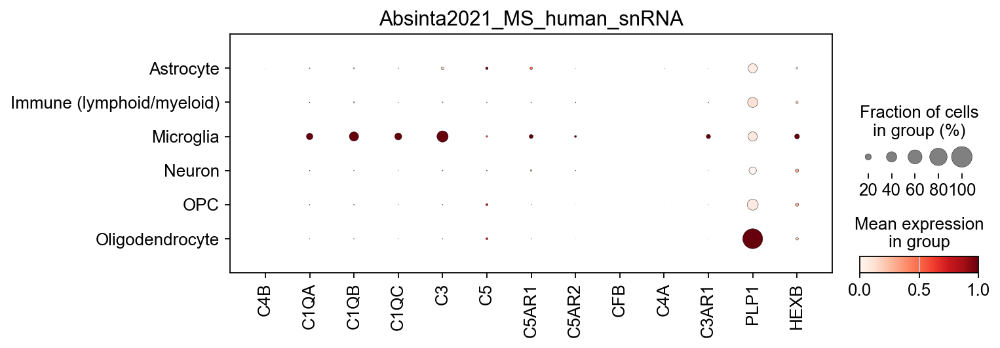


Aging_snRNA_HIP_CP_mouse: 109822 cells x 27213 genes | mouse snRNA | samples=8 | groups={'Young': 60384, 'Old': 49438}


,dataset,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,,
Astrocyte,Aging_snRNA_HIP_CP_mouse,12690,0.258,0.011,0.012,0.009,0.001,0.002,0.001,0.001,0.005,0.006,0.004,0.013
Immune (lymphoid/myeloid),Aging_snRNA_HIP_CP_mouse,350,0.011,0.003,0.011,0.006,0.000,0.000,0.000,0.000,0.009,0.009,0.017,0.017
Microglia,Aging_snRNA_HIP_CP_mouse,3112,0.027,0.291,0.419,0.359,0.000,0.001,0.083,0.070,0.002,0.004,0.091,0.002
Neuron,Aging_snRNA_HIP_CP_mouse,67036,0.016,0.010,0.011,0.007,0.001,0.001,0.001,0.001,0.010,0.019,0.012,0.012
OPC,Aging_snRNA_HIP_CP_mouse,4754,0.033,0.012,0.013,0.010,0.000,0.002,0.001,0.001,0.001,0.004,0.004,0.012
Oligodendrocyte,Aging_snRNA_HIP_CP_mouse,19593,0.130,0.013,0.012,0.010,0.000,0.000,0.001,0.001,0.001,0.004,0.003,0.006


oligodendrocytes: 19593 (13.0% C4b+); 13295 genes ranked by correlation with C4b


,frac_in_C4b-,frac_in_C4b+,enrichment(+/-),spearman_rho,fisher_p,rank
gene,,,,,,
C4a,0.0036,0.0031,0.8793,-0.0042,0.8585,NaN
C1qa,0.0127,0.0114,0.8960,-0.0041,0.6337,7317.0
C1qb,0.0117,0.0106,0.9097,-0.0038,0.7649,7160.0
C1qc,0.0100,0.0075,0.7493,-0.0091,0.2760,NaN
C3,0.0004,0.0000,0.0000,-0.0067,1.0000,NaN
C3ar1,0.0033,0.0031,0.9410,-0.0012,1.0000,NaN
Hc,0.0001,0.0004,3.3523,0.0075,0.3410,NaN
C5ar1,0.0005,0.0004,0.7450,-0.0018,1.0000,NaN
C5ar2,0.0008,0.0008,1.0315,-0.0009,1.0000,NaN


top-20 C4b-correlated genes in oligodendrocytes: Dgki, Neat1, Eya4, 9330199G10Rik, Cdh8, Sik3, Gm42756, Rnf220, Kcnq3, Agap1, Gm36855, Lypd6b, App, Aldh1l2, Gm42418, A330049N07Rik, Adamtsl1, Fmn1, Phactr1, Gm10863


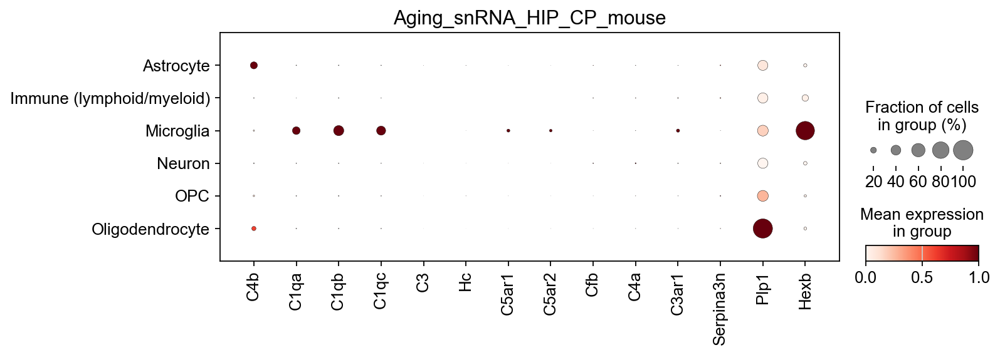


Chen2020_ST_AppNLGF_mouse: 19021 cells x 44669 genes | mouse spatial | samples=20 | groups={'WT': 9542, 'AD': 9479}
groups: {'WT': 9542, 'AD': 9479} | conditions: -
mean log-expression by group_age:


,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
WT_3M,0.099,0.267,0.328,0.282,0.011,0.008,0.005,0.005,0.001,0.058,0.015,0.149
AD_3M,0.092,0.259,0.292,0.310,0.008,0.005,0.003,0.005,0.001,0.048,0.019,0.131
WT_18M,0.187,0.254,0.286,0.299,0.013,0.006,0.005,0.005,0.000,0.106,0.019,0.135
AD_18M,0.754,0.778,0.815,0.794,0.023,0.005,0.008,0.007,0.001,0.454,0.065,0.543
WT_6M,0.072,0.150,0.163,0.165,0.011,0.007,0.005,0.002,0.000,0.043,0.015,0.059
AD_6M,0.114,0.168,0.200,0.207,0.008,0.006,0.004,0.000,0.000,0.066,0.023,0.064
WT_12M,0.119,0.229,0.257,0.234,0.016,0.011,0.009,0.006,0.000,0.075,0.014,0.103
AD_12M,0.463,0.585,0.682,0.606,0.024,0.013,0.005,0.010,0.001,0.331,0.055,0.380


co-expression with C4b across spots:


,frac_in_C4b-,frac_in_C4b+,frac_in_C4b-high,enrichment(+/-),spearman_rho,fisher_p,rank
gene,,,,,,,
C1qa,0.5040,0.7346,0.7961,1.4576,0.3479,0.0000,11.0
C1qb,0.5542,0.7629,0.8267,1.3767,0.3346,0.0000,15.0
C1qc,0.5208,0.7320,0.7986,1.4054,0.3156,0.0000,18.0
C3,0.0280,0.0515,0.0651,1.8399,0.0682,0.0000,986.0
Hc,0.0187,0.0217,0.0175,1.1617,0.0031,0.1557,13750.0
C5ar1,0.0129,0.0198,0.0185,1.5391,0.0242,0.0002,5564.0
C5ar2,0.0157,0.0187,0.0215,1.1914,0.0096,0.1240,10575.0
Cfb,0.0014,0.0026,0.0025,1.8156,0.0121,0.0940,NaN
C4a,0.1220,0.5581,0.8071,4.5740,0.5627,0.0000,1.0


top-30 C4b-correlated genes across spots: C4a, Cst7, Gfap, Ctsd, Tyrobp, Cst3, Lyz2, Trem2, Apoe, B2m, C1qa, Ctss, Ccl6, Ly86, C1qb, Cd74, Serpina3n, C1qc, Clec7a, Hexb, Fth1, Ctsz, Itgax, Mpeg1, Clu, Cd52, Trf, Cd9, Lag3, Laptm5


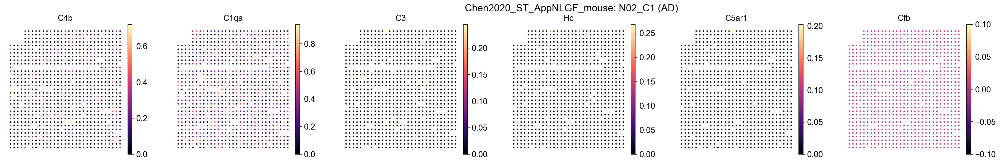

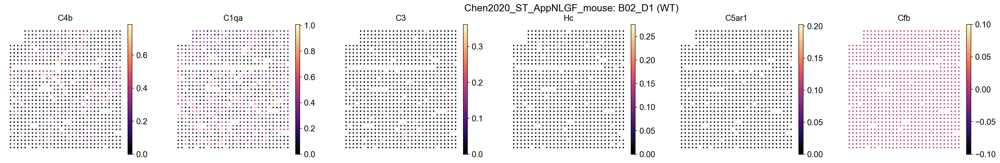


Jakel2019_MS_human_snRNA: 17790 cells x 21349 genes | human snRNA | samples=20 | groups={'MS': 11199, 'Ctrl': 6591}
UMI check for human complement genes:


,total_UMIs,cells_detected
gene,,
C4A,5,5
C4B,6,4
C5,380,359
C5AR1,190,165
C5AR2,10,10
C3,765,580
C1QA,447,317
PLP1,139859,11263


,dataset,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,C4a,C3ar1
group,,,,,,,,,,,,
Astrocyte,Jakel2019_MS_human_snRNA,1242,0.003,0.007,0.007,0.006,0.109,0.039,0.010,0.000,0.003,0.006
Immune (lymphoid/myeloid),Jakel2019_MS_human_snRNA,782,0.000,0.019,0.013,0.012,0.006,0.005,0.055,0.006,0.000,0.010
Microglia,Jakel2019_MS_human_snRNA,428,0.000,0.266,0.418,0.343,0.418,0.005,0.091,0.000,0.000,0.114
Neuron,Jakel2019_MS_human_snRNA,5031,0.000,0.006,0.008,0.004,0.008,0.015,0.007,0.001,0.000,0.001
OPC,Jakel2019_MS_human_snRNA,352,0.000,0.006,0.006,0.014,0.011,0.031,0.003,0.000,0.000,0.000
Oligodendrocyte,Jakel2019_MS_human_snRNA,7973,0.000,0.006,0.008,0.004,0.010,0.022,0.002,0.000,0.000,0.001


oligodendrocytes: 7973; C4b co-expression skipped (too few C4b+ cells or gene not quantifiable)
-- Oligodendrocyte: fraction detected by condition


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,C4a,C3ar1
group,,,,,,,,,,,
A,1102,0.0,0.005,0.007,0.004,0.012,0.012,0.000,0.0,0.0,0.001
CA,435,0.0,0.002,0.009,0.005,0.011,0.014,0.005,0.0,0.0,0.002
CI,1068,0.0,0.003,0.009,0.003,0.009,0.017,0.001,0.0,0.0,0.001
Ctrl,3530,0.0,0.006,0.008,0.004,0.009,0.034,0.002,0.0,0.0,0.000
NAWM,1478,0.0,0.008,0.009,0.005,0.014,0.014,0.001,0.0,0.0,0.001
RM,360,0.0,0.006,0.003,0.000,0.006,0.000,0.000,0.0,0.0,0.000


-- Microglia: fraction detected by condition


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,C4a,C3ar1
group,,,,,,,,,,,
A,218,0.0,0.243,0.417,0.362,0.390,0.000,0.119,0.0,0.0,0.092
CA,41,0.0,0.195,0.341,0.293,0.463,0.000,0.122,0.0,0.0,0.171
CI,32,0.0,0.469,0.625,0.500,0.469,0.031,0.125,0.0,0.0,0.156
Ctrl,78,0.0,0.256,0.295,0.192,0.423,0.013,0.026,0.0,0.0,0.115
NAWM,57,0.0,0.298,0.526,0.421,0.474,0.000,0.035,0.0,0.0,0.123


-- Astrocyte: fraction detected by condition


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,C4a,C3ar1
group,,,,,,,,,,,
A,166,0.024,0.012,0.006,0.012,0.181,0.036,0.006,0.0,0.012,0.006
CA,232,0.000,0.000,0.009,0.004,0.086,0.013,0.000,0.0,0.009,0.000
CI,115,0.000,0.000,0.000,0.009,0.087,0.035,0.035,0.0,0.000,0.009
Ctrl,454,0.000,0.011,0.002,0.004,0.121,0.053,0.002,0.0,0.000,0.009
NAWM,244,0.000,0.008,0.020,0.004,0.061,0.049,0.029,0.0,0.000,0.004
RM,31,0.000,0.000,0.000,0.000,0.161,0.000,0.000,0.0,0.000,0.000


-- Immune (lymphoid/myeloid): fraction detected by condition


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,C4a,C3ar1
group,,,,,,,,,,,
A,325,0.0,0.015,0.006,0.006,0.012,0.009,0.04,0.000,0.0,0.000
CA,412,0.0,0.017,0.007,0.012,0.002,0.002,0.07,0.012,0.0,0.017


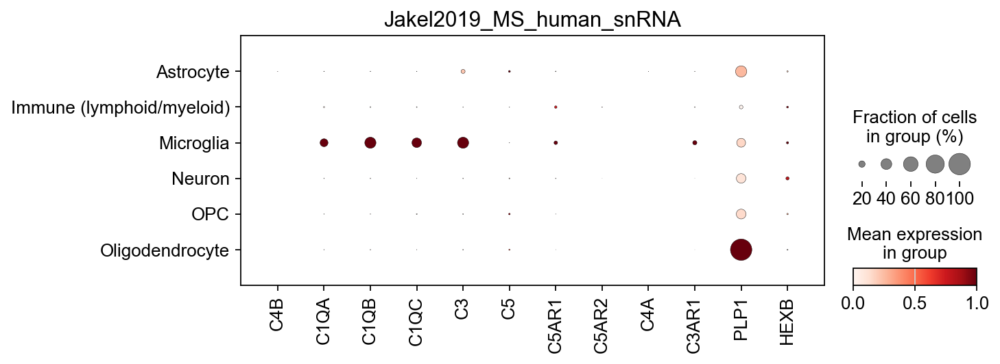


Kaya2022_aged_WM_vs_GM_scRNA: 29623 cells x 20027 genes | mouse scRNA | samples=8 | groups={'WM': 23391, 'GM': 6232}


,dataset,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,,
Astrocyte,Kaya2022_aged_WM_vs_GM_scRNA,1933,0.267,0.251,0.247,0.160,0.018,0.004,0.004,0.003,0.001,0.002,0.007,0.053
Immune (lymphoid/myeloid),Kaya2022_aged_WM_vs_GM_scRNA,5877,0.121,0.888,0.885,0.868,0.105,0.000,0.314,0.197,0.004,0.001,0.495,0.028
Microglia,Kaya2022_aged_WM_vs_GM_scRNA,5054,0.100,0.991,0.988,0.984,0.015,0.000,0.384,0.384,0.001,0.000,0.622,0.032
Neuron,Kaya2022_aged_WM_vs_GM_scRNA,546,0.115,0.262,0.225,0.147,0.002,0.000,0.004,0.004,0.000,0.004,0.011,0.027
OPC,Kaya2022_aged_WM_vs_GM_scRNA,90,0.389,0.456,0.411,0.200,0.000,0.011,0.022,0.000,0.000,0.000,0.044,0.222
Oligodendrocyte,Kaya2022_aged_WM_vs_GM_scRNA,15776,0.768,0.306,0.285,0.185,0.001,0.000,0.002,0.003,0.000,0.003,0.009,0.417


oligodendrocytes: 15776 (76.8% C4b+); 11601 genes ranked by correlation with C4b


,frac_in_C4b-,frac_in_C4b+,enrichment(+/-),spearman_rho,fisher_p,rank
gene,,,,,,
C4a,0.0008,0.0036,4.3375,0.0260,0.0046,NaN
C1qa,0.3705,0.2868,0.7741,-0.1120,0.0000,11457.0
C1qb,0.3351,0.2703,0.8066,-0.0904,0.0000,11382.0
C1qc,0.2071,0.1779,0.8588,-0.0591,0.0001,11162.0
C3,0.0005,0.0017,3.0262,0.0175,0.1351,NaN
C3ar1,0.0090,0.0087,0.9629,-0.0075,0.8398,NaN
Hc,0.0000,0.0000,NaN,NaN,1.0000,NaN
C5ar1,0.0019,0.0025,1.2969,0.0025,0.6968,NaN
C5ar2,0.0035,0.0026,0.7449,-0.0010,0.3774,NaN


top-20 C4b-correlated genes in oligodendrocytes: Serpina3n, Cldn11, Tmsb4x, Trf, Rab3b, Cela1, Cebpd, Cd9, H2-D1, Aldh1l2, Apod, Tmed10, Stat3, Anxa2, Socs3, Fxyd1, Plvap, Bcl3, Lbh, Masp1


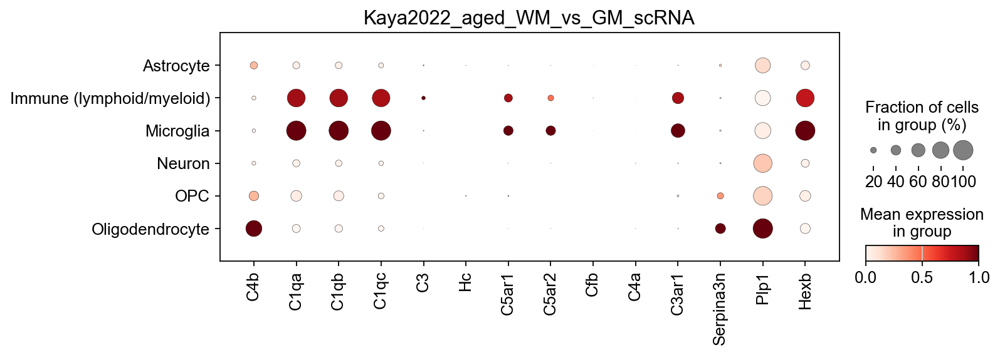


LPC_Cuprizone_CC_snRNA_mouse: 30338 cells x 25075 genes | mouse snRNA | samples=8 | groups={'Ctrl': 14550, 'LPC': 9493, 'Cuprizone': 6295}


,dataset,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,,
Astrocyte,LPC_Cuprizone_CC_snRNA_mouse,835,0.302,0.255,0.262,0.184,0.034,0.007,0.004,0.004,0.005,0.001,0.026,0.149
Immune (lymphoid/myeloid),LPC_Cuprizone_CC_snRNA_mouse,2680,0.036,0.461,0.462,0.406,0.013,0.000,0.029,0.020,0.006,0.001,0.155,0.035
Microglia,LPC_Cuprizone_CC_snRNA_mouse,5820,0.064,0.788,0.809,0.738,0.010,0.001,0.094,0.039,0.013,0.000,0.223,0.039
Neuron,LPC_Cuprizone_CC_snRNA_mouse,4343,0.023,0.147,0.150,0.120,0.002,0.001,0.003,0.003,0.007,0.006,0.023,0.026
OPC,LPC_Cuprizone_CC_snRNA_mouse,3130,0.123,0.261,0.258,0.207,0.003,0.003,0.009,0.007,0.005,0.001,0.034,0.050
Oligodendrocyte,LPC_Cuprizone_CC_snRNA_mouse,12880,0.128,0.151,0.150,0.113,0.001,0.000,0.002,0.001,0.002,0.001,0.012,0.057


oligodendrocytes: 12880 (12.8% C4b+); 10656 genes ranked by correlation with C4b


,frac_in_C4b-,frac_in_C4b+,enrichment(+/-),spearman_rho,fisher_p,rank
gene,,,,,,
C4a,0.0005,0.0006,1.1399,-0.0002,1.0000,NaN
C1qa,0.1250,0.3299,2.6384,0.1825,0.0000,9.0
C1qb,0.1226,0.3335,2.7198,0.1877,0.0000,7.0
C1qc,0.0906,0.2635,2.9091,0.1763,0.0000,13.0
C3,0.0011,0.0012,1.1399,0.0010,0.6970,NaN
C3ar1,0.0085,0.0359,4.2476,0.0820,0.0000,444.0
Hc,0.0002,0.0006,3.4197,0.0075,0.3360,NaN
C5ar1,0.0013,0.0030,2.2798,0.0140,0.1666,NaN
C5ar2,0.0011,0.0006,0.5699,-0.0052,1.0000,NaN


top-20 C4b-correlated genes in oligodendrocytes: Apoe, Ctsd, Serpina3n, Ddx60, Ctsb, Rhoj, C1qb, Slc39a14, C1qa, H2-D1, Hexb, B2m, C1qc, Fmn1, Lyz2, Ifi27l2a, Ctss, Apod, Nlrc5, Neat1
-- Oligodendrocyte: fraction detected by group


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
Ctrl,9717,0.084,0.063,0.062,0.037,0.001,0.000,0.000,0.000,0.001,0.000,0.002,0.027
Cuprizone,1388,0.159,0.122,0.133,0.094,0.003,0.001,0.003,0.001,0.002,0.000,0.011,0.144
LPC,1775,0.341,0.656,0.643,0.542,0.002,0.001,0.007,0.006,0.002,0.002,0.066,0.151


-- Microglia: fraction detected by group


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
Ctrl,784,0.050,0.587,0.659,0.518,0.006,0.000,0.040,0.048,0.003,0.0,0.084,0.018
Cuprizone,322,0.087,0.323,0.314,0.335,0.012,0.000,0.050,0.043,0.003,0.0,0.099,0.096
LPC,4714,0.065,0.853,0.868,0.803,0.011,0.001,0.106,0.037,0.016,0.0,0.254,0.039


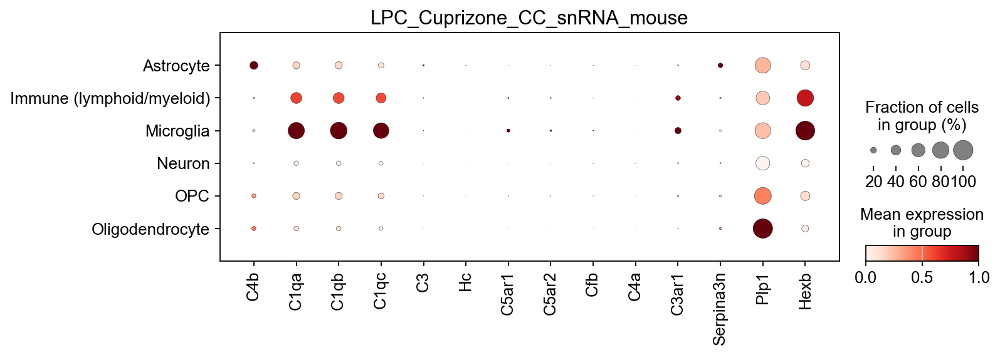


Leng2021_AD_human_snRNA: 92199 cells x 29056 genes | human snRNA | samples=20 | groups={'AD': 51980, 'Ctrl': 40219}


UMI check for human complement genes:


,total_UMIs,cells_detected
gene,,
C4A,16,16
C4B,19,18
C5,3205,3020
C5AR1,2030,1927
C5AR2,883,840
CFB,86,85
C3,5919,4379
C1QA,2141,1770
PLP1,123030,35601


,dataset,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,,
Astrocyte,Leng2021_AD_human_snRNA,11901,0.001,0.007,0.012,0.009,0.037,0.039,0.011,0.004,0.001,0.001,0.007,0.006
Immune (lymphoid/myeloid),Leng2021_AD_human_snRNA,2110,0.000,0.137,0.214,0.246,0.333,0.015,0.045,0.010,0.001,0.000,0.055,0.000
Microglia,Leng2021_AD_human_snRNA,4460,0.000,0.222,0.296,0.275,0.410,0.026,0.030,0.018,0.001,0.000,0.094,0.001
Neuron,Leng2021_AD_human_snRNA,40386,0.000,0.006,0.010,0.007,0.025,0.037,0.033,0.015,0.001,0.000,0.013,0.006
OPC,Leng2021_AD_human_snRNA,5605,0.000,0.008,0.011,0.008,0.020,0.036,0.009,0.004,0.000,0.000,0.004,0.004
Oligodendrocyte,Leng2021_AD_human_snRNA,26808,0.000,0.004,0.007,0.005,0.009,0.026,0.006,0.003,0.000,0.000,0.003,0.002


oligodendrocytes: 26808; C4b co-expression skipped (too few C4b+ cells or gene not quantifiable)
-- Oligodendrocyte: fraction detected by braak


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
0,2291,0.0,0.001,0.000,0.002,0.007,0.020,0.007,0.002,0.0,0.0,0.002,0.002
2,6436,0.0,0.003,0.005,0.002,0.011,0.031,0.003,0.003,0.0,0.0,0.003,0.002
6,18081,0.0,0.005,0.009,0.007,0.008,0.025,0.006,0.003,0.0,0.0,0.003,0.001


-- Microglia: fraction detected by braak


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
0,310,0.0,0.216,0.174,0.194,0.597,0.016,0.013,0.023,0.003,0.0,0.039,0.003
2,1083,0.0,0.274,0.367,0.307,0.505,0.016,0.044,0.021,0.001,0.0,0.107,0.001
6,3067,0.0,0.205,0.283,0.271,0.357,0.031,0.026,0.016,0.000,0.0,0.095,0.001


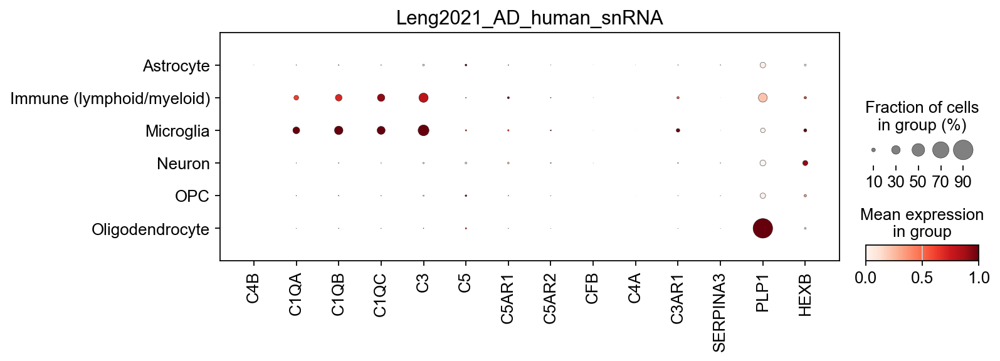


LermaMartin2024_MS_human_Visium: 70238 cells x 25499 genes | human spatial | samples=18 | groups={'MS': 45870, 'Ctrl': 24368}


UMI check for human complement genes:


,total_UMIs,cells_detected
gene,,
C4A,138,138
C4B,242,234
C5,950,900
C5AR1,3693,3089
C5AR2,281,265
CFB,1248,1167
C3,72375,26686
C1QA,44852,20215
PLP1,1918911,61098


groups: {'MS': 45870, 'Ctrl': 24368} | conditions: {'Chronic Active': 30282, 'Control': 24368, 'Chronic Inactive': 15588}
mean log-expression by condition_original:


,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
Chronic Active,0.007,0.860,1.346,0.702,0.957,0.012,0.123,0.005,0.029,0.003,0.188,1.276
Control,0.001,0.334,0.588,0.241,0.603,0.024,0.014,0.004,0.018,0.001,0.054,0.381
Chronic Inactive,0.003,0.361,0.529,0.292,0.726,0.018,0.065,0.010,0.028,0.003,0.065,1.390


co-expression with C4b across spots:


,frac_in_C4b-,frac_in_C4b+,frac_in_C4b-high,enrichment(+/-),spearman_rho,fisher_p,rank
gene,,,,,,,
C1qa,0.2868,0.5983,0.2881,2.0863,0.0381,0.0000,124.0
C1qb,0.4004,0.6795,0.4746,1.6969,0.0352,0.0000,236.0
C1qc,0.2336,0.5299,0.1864,2.2680,0.0387,0.0000,138.0
C3,0.3787,0.7436,0.6271,1.9634,0.0502,0.0000,17.0
Hc,0.0127,0.0342,0.0169,2.6831,0.0109,0.0112,9782.0
C5ar1,0.0437,0.1368,0.1017,3.1316,0.0254,0.0000,1355.0
C5ar2,0.0038,0.0085,0.0000,2.2750,0.0045,0.2211,NaN
Cfb,0.0166,0.0256,0.0169,1.5461,0.0040,0.2937,12232.0
C4a,0.0018,0.0385,0.0000,20.8718,0.0475,0.0000,NaN


top-30 C4b-correlated genes across spots: CHI3L2, SERPINA3, LTF, AC004556.3, CLU, CHI3L1, MAOB, CRISPLD1, FCGR3A, SLC14A1, BAG3, MATN2, CP, CD44, SERPING1, CFI, C3, SLC2A5, HSPA5, ITM2C, ECM2, PDIA4, C10orf105, MGST1, FCGR2A, MAN1C1, AQP1, PDIA6, ATP1B2, AEBP1


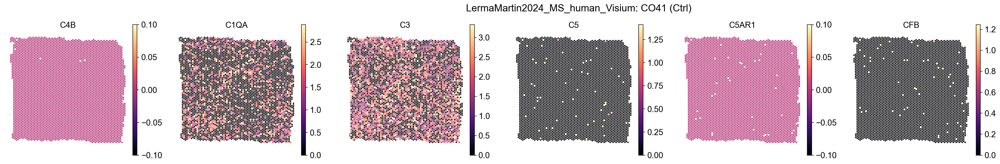

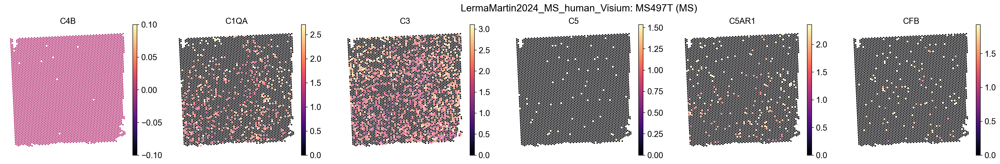


LermaMartin2024_MS_human_snRNA: 102672 cells x 31203 genes | human snRNA | samples=16 | groups={'MS': 73637, 'Ctrl': 29035}


UMI check for human complement genes:


,total_UMIs,cells_detected
gene,,
C4A,87,84
C4B,147,143
C5,11740,8549
C5AR1,5930,4042
C5AR2,1143,913
CFB,699,571
C3,32185,10812
C1QA,6140,3383
PLP1,1186262,60647


,dataset,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,,
Astrocyte,LermaMartin2024_MS_human_snRNA,13985,0.009,0.002,0.003,0.002,0.285,0.149,0.064,0.001,0.007,0.006,0.001,0.333
Immune (lymphoid/myeloid),LermaMartin2024_MS_human_snRNA,270,0.000,0.022,0.015,0.011,0.026,0.059,0.015,0.015,0.000,0.000,0.000,0.019
Microglia,LermaMartin2024_MS_human_snRNA,9238,0.000,0.350,0.488,0.326,0.715,0.073,0.167,0.068,0.016,0.000,0.202,0.000
Neuron,LermaMartin2024_MS_human_snRNA,8171,0.000,0.001,0.002,0.002,0.007,0.057,0.114,0.029,0.003,0.000,0.002,0.003
OPC,LermaMartin2024_MS_human_snRNA,3945,0.000,0.000,0.000,0.002,0.006,0.099,0.004,0.001,0.002,0.000,0.000,0.004
Oligodendrocyte,LermaMartin2024_MS_human_snRNA,64833,0.000,0.000,0.000,0.000,0.002,0.075,0.008,0.000,0.000,0.000,0.000,0.001


oligodendrocytes: 64833; C4b co-expression skipped (too few C4b+ cells or gene not quantifiable)


-- Oligodendrocyte: fraction detected by condition


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
CA,27370,0.0,0.0,0.001,0.001,0.001,0.060,0.014,0.000,0.0,0.0,0.0,0.001
CI,15968,0.0,0.0,0.000,0.000,0.001,0.089,0.003,0.001,0.0,0.0,0.0,0.001
Ctrl,21495,0.0,0.0,0.000,0.000,0.003,0.083,0.004,0.000,0.0,0.0,0.0,0.000


-- Microglia: fraction detected by condition


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
CA,4410,0.0,0.400,0.617,0.406,0.737,0.077,0.246,0.085,0.028,0.0,0.222,0.0
CI,2824,0.0,0.401,0.500,0.368,0.636,0.112,0.107,0.055,0.003,0.0,0.249,0.0
Ctrl,2004,0.0,0.166,0.187,0.089,0.778,0.007,0.079,0.048,0.008,0.0,0.094,0.0


-- Astrocyte: fraction detected by condition


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
CA,6396,0.014,0.001,0.002,0.001,0.389,0.127,0.078,0.001,0.008,0.007,0.000,0.463
CI,5087,0.005,0.003,0.007,0.005,0.222,0.173,0.063,0.002,0.008,0.002,0.003,0.271
Ctrl,2502,0.007,0.000,0.000,0.001,0.145,0.155,0.032,0.000,0.002,0.008,0.000,0.124


-- Immune (lymphoid/myeloid): fraction detected by condition


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
CA,122,0.0,0.025,0.025,0.008,0.008,0.033,0.016,0.008,0.0,0.0,0.0,0.041
CI,148,0.0,0.020,0.007,0.014,0.041,0.081,0.014,0.020,0.0,0.0,0.0,0.000


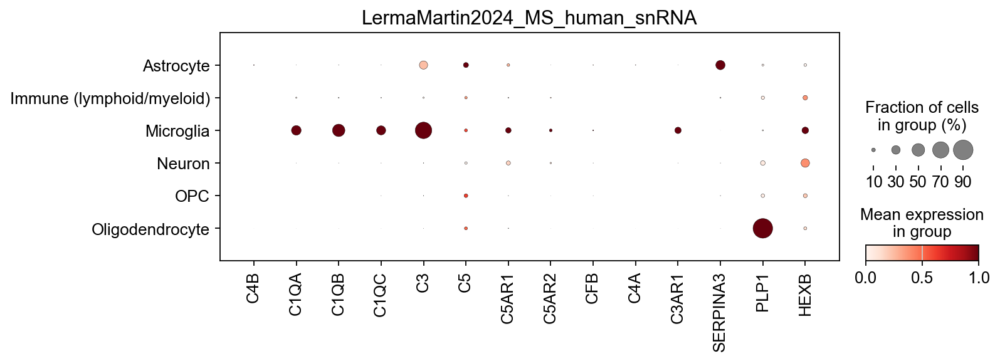


Park2023_AD_hippocampus_scRNA: 47660 cells x 21809 genes | mouse scRNA | samples=6 | groups={'AD': 27003, 'WT': 20657}


,dataset,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,,
Astrocyte,Park2023_AD_hippocampus_scRNA,7470,0.049,0.312,0.350,0.274,0.000,0.002,0.012,0.004,0.001,0.001,0.016,0.009
Immune (lymphoid/myeloid),Park2023_AD_hippocampus_scRNA,1644,0.054,0.779,0.804,0.782,0.018,0.000,0.256,0.030,0.005,0.001,0.257,0.002
Microglia,Park2023_AD_hippocampus_scRNA,13952,0.010,0.979,0.979,0.972,0.001,0.000,0.207,0.064,0.001,0.000,0.264,0.002
Neuron,Park2023_AD_hippocampus_scRNA,3298,0.009,0.284,0.315,0.268,0.000,0.000,0.011,0.003,0.000,0.001,0.019,0.004
OPC,Park2023_AD_hippocampus_scRNA,2471,0.168,0.339,0.316,0.240,0.001,0.004,0.015,0.008,0.006,0.003,0.031,0.056
Oligodendrocyte,Park2023_AD_hippocampus_scRNA,10237,0.063,0.336,0.361,0.278,0.000,0.000,0.009,0.003,0.000,0.001,0.013,0.023


oligodendrocytes: 10237 (6.3% C4b+); 11007 genes ranked by correlation with C4b


,frac_in_C4b-,frac_in_C4b+,enrichment(+/-),spearman_rho,fisher_p,rank
gene,,,,,,
C4a,0.0015,0.0000,0.0000,-0.0096,1.0000,NaN
C1qa,0.3375,0.3164,0.9374,-0.0151,0.2829,10666.0
C1qb,0.3623,0.3380,0.9329,-0.0145,0.2205,10649.0
C1qc,0.2807,0.2361,0.8410,-0.0268,0.0144,10868.0
C3,0.0004,0.0000,0.0000,-0.0051,1.0000,NaN
C3ar1,0.0133,0.0062,0.4624,-0.0153,0.1475,10673.0
Hc,0.0003,0.0000,0.0000,-0.0044,1.0000,NaN
C5ar1,0.0090,0.0077,0.8603,-0.0025,1.0000,NaN
C5ar2,0.0031,0.0015,0.4933,-0.0073,0.7199,NaN


top-20 C4b-correlated genes in oligodendrocytes: Micos13, mt-Nd3, Gm42418, mt-Nd2, Selenom, Gapdh, H3f3b, Hist1h1c, Retreg1, Snu13, mt-Atp6, mt-Nd4, mt-Nd1, Selenos, mt-Nd5, mt-Cytb, Selenof, Morf4l1, Tle5, Elob


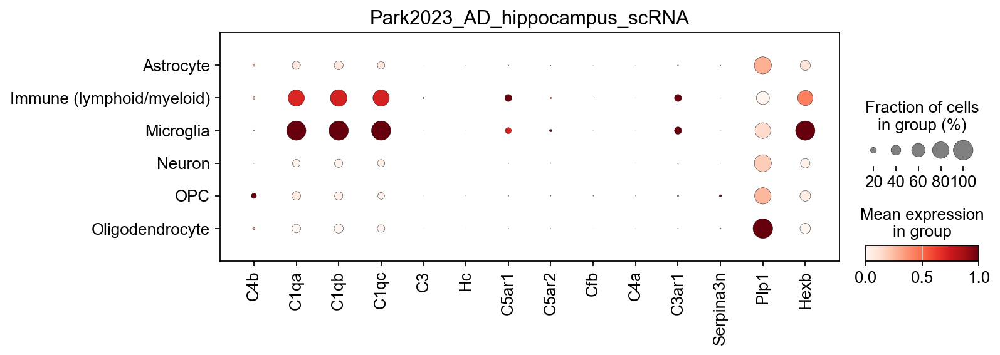


Sadick2022_AD_human_astro_oligo_snRNA: 107392 cells x 32263 genes | human snRNA | samples=17 | groups={'AD': 64500, 'Ctrl': 42892}


UMI check for human complement genes:


,total_UMIs,cells_detected
gene,,
C4A,458,451
C4B,470,459
C5,18803,14417
C5AR1,5861,4033
C5AR2,896,678
CFB,929,810
C3,25479,9873
C1QA,4707,2273
PLP1,496308,39109


,dataset,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,,
Astrocyte,Sadick2022_AD_human_astro_oligo_snRNA,47240,0.008,0.005,0.008,0.005,0.096,0.173,0.025,0.002,0.006,0.008,0.004,0.288
Immune (lymphoid/myeloid),Sadick2022_AD_human_astro_oligo_snRNA,3556,0.001,0.495,0.645,0.601,0.703,0.089,0.244,0.115,0.022,0.001,0.293,0.043
Neuron,Sadick2022_AD_human_astro_oligo_snRNA,12399,0.001,0.007,0.012,0.006,0.028,0.073,0.079,0.008,0.009,0.001,0.004,0.137
OPC,Sadick2022_AD_human_astro_oligo_snRNA,7116,0.007,0.005,0.009,0.007,0.259,0.168,0.045,0.003,0.021,0.007,0.004,0.279
Oligodendrocyte,Sadick2022_AD_human_astro_oligo_snRNA,33750,0.000,0.003,0.005,0.003,0.016,0.108,0.014,0.001,0.001,0.001,0.001,0.049


oligodendrocytes: 33750; C4b co-expression skipped (too few C4b+ cells or gene not quantifiable)


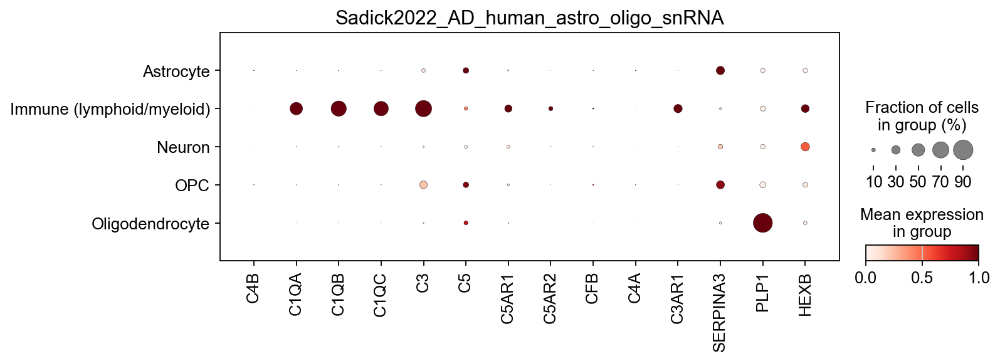


Schirmer2019_MS_human_snRNA: 48919 cells x 33741 genes | human snRNA | samples=21 | groups={'MS': 31516, 'Ctrl': 17403}


UMI check for human complement genes:


,total_UMIs,cells_detected
gene,,
C4A,33,15
C4B,68,30
C5,4110,2338
C5AR1,2258,1652
C5AR2,745,540
CFB,54,36
C3,6326,2514
C1QA,3106,1146
PLP1,90581,21632


,dataset,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,,
Astrocyte,Schirmer2019_MS_human_snRNA,5381,0.004,0.008,0.013,0.004,0.063,0.059,0.015,0.003,0.001,0.002,0.004,0.007
Immune (lymphoid/myeloid),Schirmer2019_MS_human_snRNA,158,0.000,0.139,0.139,0.063,0.089,0.038,0.025,0.000,0.006,0.000,0.025,0.006
Microglia,Schirmer2019_MS_human_snRNA,1425,0.000,0.429,0.481,0.379,0.580,0.032,0.055,0.033,0.001,0.000,0.119,0.001
Neuron,Schirmer2019_MS_human_snRNA,6917,0.000,0.008,0.012,0.003,0.024,0.042,0.033,0.008,0.000,0.000,0.009,0.003
OPC,Schirmer2019_MS_human_snRNA,3844,0.001,0.011,0.013,0.005,0.022,0.048,0.007,0.001,0.000,0.000,0.004,0.003
Oligodendrocyte,Schirmer2019_MS_human_snRNA,12394,0.000,0.005,0.010,0.003,0.012,0.036,0.006,0.002,0.000,0.000,0.002,0.002


oligodendrocytes: 12394; C4b co-expression skipped (too few C4b+ cells or gene not quantifiable)
-- Oligodendrocyte: fraction detected by condition


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
Acute/Chronic active,8266,0.0,0.006,0.013,0.004,0.013,0.038,0.006,0.002,0.0,0.0,0.003,0.002
Chronic inactive,1058,0.0,0.004,0.009,0.001,0.013,0.022,0.002,0.003,0.0,0.0,0.002,0.001
Control,3070,0.0,0.003,0.002,0.001,0.008,0.036,0.005,0.001,0.0,0.0,0.001,0.002


-- Microglia: fraction detected by condition


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
Acute/Chronic active,1032,0.0,0.413,0.493,0.396,0.583,0.037,0.047,0.034,0.001,0.0,0.123,0.000
Chronic inactive,257,0.0,0.459,0.479,0.335,0.514,0.023,0.101,0.027,0.000,0.0,0.105,0.000
Control,136,0.0,0.500,0.390,0.331,0.676,0.015,0.037,0.037,0.000,0.0,0.110,0.007


-- Astrocyte: fraction detected by condition


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
Acute/Chronic active,2422,0.008,0.010,0.019,0.007,0.085,0.071,0.019,0.004,0.000,0.002,0.007,0.007
Chronic inactive,1388,0.001,0.012,0.014,0.003,0.067,0.045,0.014,0.004,0.000,0.002,0.001,0.011
Control,1571,0.001,0.002,0.003,0.001,0.027,0.055,0.010,0.001,0.001,0.003,0.001,0.003


-- Immune (lymphoid/myeloid): fraction detected by condition


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
Acute/Chronic active,122,0.0,0.107,0.164,0.066,0.074,0.041,0.025,0.0,0.008,0.0,0.025,0.000
Chronic inactive,34,0.0,0.265,0.059,0.059,0.147,0.029,0.029,0.0,0.000,0.0,0.029,0.029


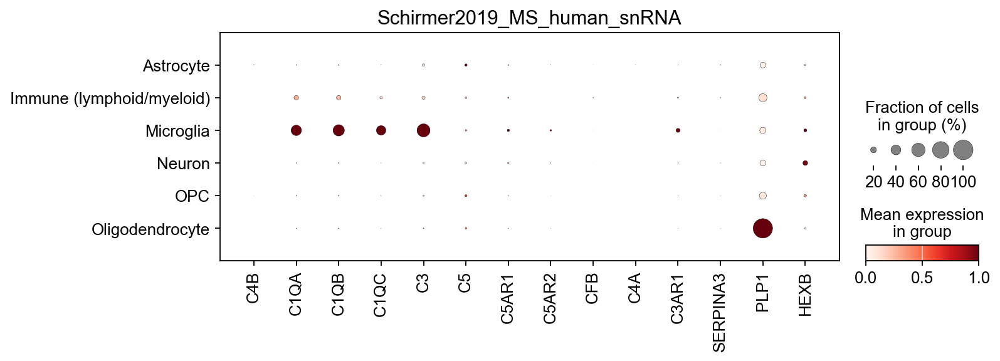


SenescentGlia2025_MS_human_Visium: 27619 cells x 22052 genes | human spatial | samples=12 | groups={'MS': 27619}


UMI check for human complement genes:


,total_UMIs,cells_detected
gene,,
C4A,27,25
C4B,19,19
C5,147,137
C5AR1,130,122
C5AR2,68,64
CFB,80,74
C3,2576,2021
C1QA,2000,1627
PLP1,72452,17000


groups: {'MS': 27619} | conditions: {'secondary progressive MS': 19193, 'progressive MS': 5726, 'primary progressive MS': 2700}
mean log-expression by condition_original:


,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
secondary progressive MS,0.001,0.089,0.148,0.050,0.120,0.008,0.006,0.005,0.006,0.001,0.020,0.202
progressive MS,0.005,0.416,0.718,0.222,0.494,0.008,0.021,0.003,0.005,0.007,0.034,0.842
primary progressive MS,0.003,0.146,0.220,0.071,0.211,0.036,0.015,0.008,0.008,0.002,0.088,0.194


C4b not quantifiable in this dataset (see UMI check); spot-level C4b co-expression skipped


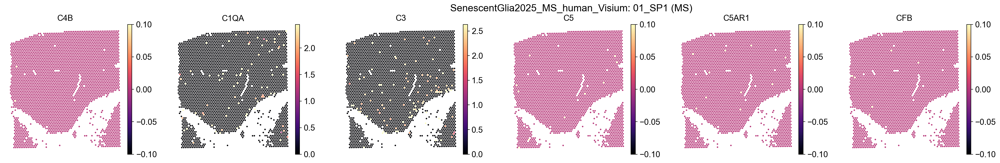


Serpina3n_Cuprizone_snRNA_mouse: 52437 cells x 27508 genes | mouse snRNA | samples=5 | groups={'Cuprizone': 34123, 'Ctrl': 18314}


,dataset,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,,
Astrocyte,Serpina3n_Cuprizone_snRNA_mouse,2968,0.092,0.005,0.011,0.008,0.001,0.003,0.002,0.001,0.005,0.006,0.003,0.019
Immune (lymphoid/myeloid),Serpina3n_Cuprizone_snRNA_mouse,301,0.000,0.000,0.013,0.013,0.000,0.000,0.000,0.000,0.000,0.017,0.000,0.003
Microglia,Serpina3n_Cuprizone_snRNA_mouse,2413,0.010,0.063,0.112,0.106,0.000,0.000,0.012,0.016,0.002,0.002,0.036,0.016
Neuron,Serpina3n_Cuprizone_snRNA_mouse,30390,0.003,0.006,0.008,0.010,0.000,0.002,0.001,0.000,0.002,0.016,0.003,0.022
OPC,Serpina3n_Cuprizone_snRNA_mouse,4186,0.016,0.008,0.009,0.013,0.001,0.001,0.000,0.001,0.000,0.007,0.003,0.019
Oligodendrocyte,Serpina3n_Cuprizone_snRNA_mouse,8207,0.023,0.015,0.027,0.025,0.001,0.001,0.004,0.003,0.001,0.006,0.010,0.011


oligodendrocytes: 8207 (2.3% C4b+); 13537 genes ranked by correlation with C4b


,frac_in_C4b-,frac_in_C4b+,enrichment(+/-),spearman_rho,fisher_p,rank
gene,,,,,,
C4a,0.0060,0.0106,1.7773,0.0086,0.3183,NaN
C1qa,0.0126,0.1064,8.4464,0.1140,0.0000,454.0
C1qb,0.0227,0.1968,8.6715,0.1586,0.0000,35.0
C1qc,0.0202,0.2181,10.7952,0.1863,0.0000,4.0
C3,0.0005,0.0053,10.6636,0.0288,0.1094,NaN
C3ar1,0.0086,0.0904,10.5090,0.1183,0.0000,377.0
Hc,0.0007,0.0053,7.1090,0.0234,0.1498,NaN
C5ar1,0.0036,0.0372,10.2959,0.0748,0.0000,NaN
C5ar2,0.0026,0.0266,10.1558,0.0629,0.0003,NaN


top-20 C4b-correlated genes in oligodendrocytes: Fcer1g, Hk2, Gm32509, C1qc, Tes, Ddx60, Fgd2, Gm20713, Gm13919, Apoe, Irf8, Cd180, Gm35188, Tbxas1, Casp8, Fyb, Rigi, Stab1, Zfp36l1, E130114P18Rik


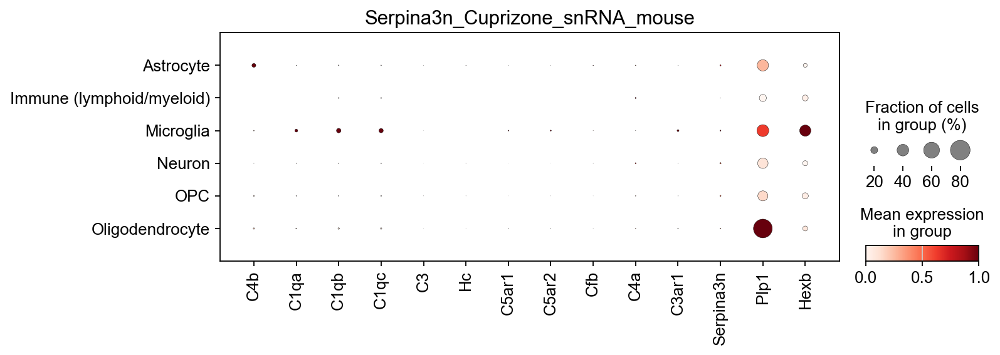


Ximerakis2019_aging_brain_scRNA: 37069 cells x 14698 genes | mouse scRNA | samples=16 | groups={'Old': 21041, 'Young': 16028}


,dataset,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,C3ar1,Serpina3n
group,,,,,,,,,,,,
Astrocyte,Ximerakis2019_aging_brain_scRNA,6747,0.165,0.044,0.044,0.036,0.000,0.004,0.000,0.000,0.001,0.017
Immune (lymphoid/myeloid),Ximerakis2019_aging_brain_scRNA,700,0.154,0.559,0.564,0.559,0.041,0.000,0.264,0.043,0.277,0.000
Microglia,Ximerakis2019_aging_brain_scRNA,3910,0.009,0.999,0.998,0.997,0.002,0.000,0.271,0.118,0.353,0.002
Neuron,Ximerakis2019_aging_brain_scRNA,1368,0.186,0.062,0.064,0.048,0.001,0.001,0.001,0.000,0.000,0.211
OPC,Ximerakis2019_aging_brain_scRNA,2187,0.047,0.037,0.045,0.034,0.002,0.002,0.001,0.000,0.001,0.052
Oligodendrocyte,Ximerakis2019_aging_brain_scRNA,12384,0.155,0.039,0.041,0.029,0.000,0.000,0.000,0.000,0.001,0.035


oligodendrocytes: 12384 (15.5% C4b+); 9724 genes ranked by correlation with C4b


,frac_in_C4b-,frac_in_C4b+,enrichment(+/-),spearman_rho,fisher_p,rank
gene,,,,,,
C1qa,0.0368,0.0511,1.3881,0.0199,0.0039,2824.0
C1qb,0.0403,0.0459,1.1372,0.0068,0.2608,6589.0
C1qc,0.0278,0.0339,1.2181,0.0094,0.1575,5920.0
C3,0.0001,0.0000,0.0000,-0.0038,1.0000,NaN
C3ar1,0.0011,0.0016,1.3633,0.0047,0.7173,NaN
Hc,0.0003,0.0000,0.0000,-0.0066,1.0000,NaN
C5ar1,0.0002,0.0005,2.7267,0.0062,0.3966,NaN
C5ar2,0.0002,0.0000,0.0000,-0.0054,1.0000,NaN
Cfh,0.0012,0.0021,1.6780,0.0067,0.3208,NaN


top-20 C4b-correlated genes in oligodendrocytes: Serpina3n, H2-D1, B2m, Hopx, Ifi27, Ifi27l2a, Cela1, 7630403G23Rik, Gadd45a, Csf1, Cbs, Stat3, Flnc, Tubb3, St8sia5, Irf9, Rab3b, Rnase4, Tmem59l, Lbh


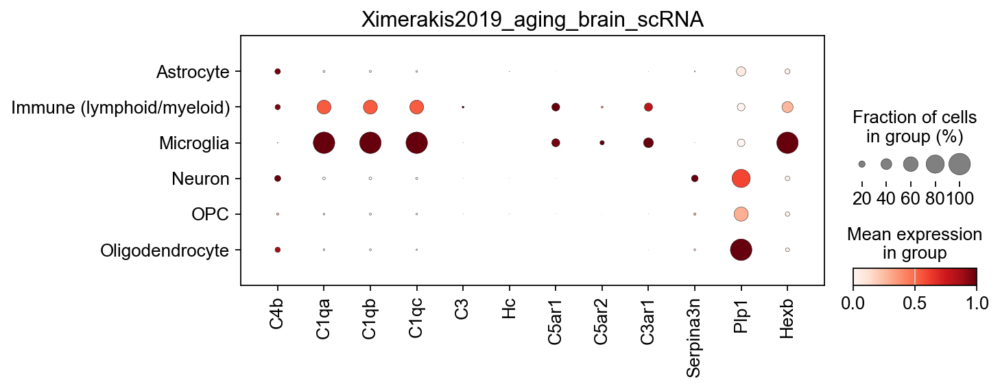


Zhou2020_5XFAD_snRNA: 125858 cells x 24693 genes | mouse snRNA | samples=20 | groups={'WT': 69841, 'AD': 56017}


,dataset,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C3ar1,Serpina3n
group,,,,,,,,,,,,,
Astrocyte,Zhou2020_5XFAD_snRNA,7217,0.173,0.043,0.039,0.037,0.001,0.003,0.001,0.001,0.0,0.003,0.014
Microglia,Zhou2020_5XFAD_snRNA,4152,0.018,0.788,0.760,0.843,0.000,0.000,0.056,0.040,0.0,0.176,0.002
Neuron,Zhou2020_5XFAD_snRNA,91680,0.016,0.029,0.027,0.023,0.000,0.001,0.000,0.000,0.0,0.001,0.015
OPC,Zhou2020_5XFAD_snRNA,3261,0.073,0.031,0.024,0.025,0.001,0.002,0.000,0.001,0.0,0.003,0.068
Oligodendrocyte,Zhou2020_5XFAD_snRNA,17356,0.124,0.057,0.055,0.054,0.000,0.000,0.003,0.001,0.0,0.005,0.020


oligodendrocytes: 17356 (12.4% C4b+); 11527 genes ranked by correlation with C4b


,frac_in_C4b-,frac_in_C4b+,enrichment(+/-),spearman_rho,fisher_p,rank
gene,,,,,,
C1qa,0.0554,0.0687,1.2399,0.0170,0.0149,233.0
C1qb,0.0539,0.0640,1.1871,0.0117,0.0620,482.0
C1qc,0.0526,0.0626,1.1903,0.0117,0.0591,477.0
C3,0.0001,0.0009,7.0538,0.0198,0.0779,NaN
C3ar1,0.0053,0.0070,1.3226,0.0063,0.3469,NaN
Hc,0.0002,0.0000,0.0000,-0.0049,1.0000,NaN
C5ar1,0.0023,0.0042,1.8138,0.0105,0.1092,NaN
C5ar2,0.0015,0.0014,0.9201,-0.0015,1.0000,NaN
Cfb,0.0001,0.0000,0.0000,-0.0040,1.0000,NaN


top-20 C4b-correlated genes in oligodendrocytes: Serpina3n, Klk6, Ttr, H2-D1, Trf, Neat1, Malat1, Apod, Cd9, Cldn11, mt-Atp6, Cd63, Gfap, Apoe, Fbl, Aldh1l2, Ifi27, H2-K1, Gm26870, B2m


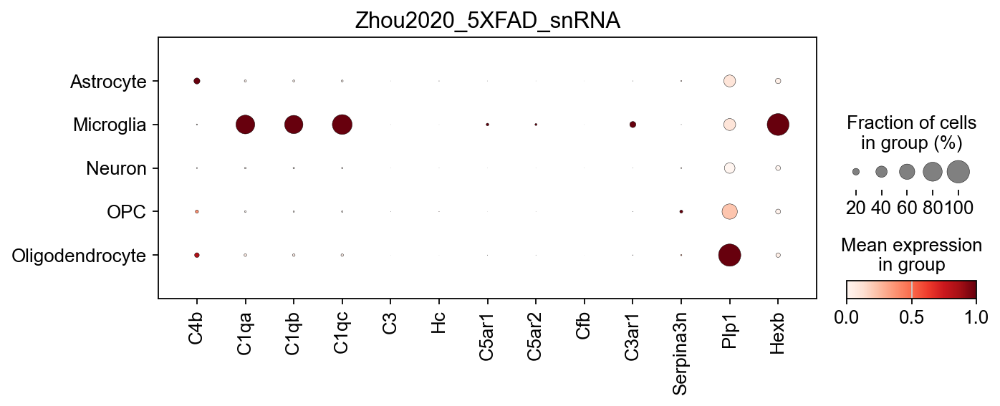


done: 16 datasets


In [3]:
DET, DE, CO, RANKS, TOP, COND, SPATIAL, HUMAN_C4, INFO = [], [], {}, {}, {}, {}, {}, {}, {}
np.random.seed(0)
for name, path in PATHS.items():
    a = sc.read_h5ad(path)
    a.obs["cell_type_coarse"] = a.obs["cell_type_coarse"].astype(str)
    species, modality = a.obs["species"].iloc[0], a.obs["modality"].iloc[0]
    ref, alts = alt_groups(a)
    INFO[name] = {"n_cells": a.n_obs, "species": species, "modality": modality, "n_samples": a.obs["sample"].nunique(),
                  "groups": a.obs["group"].value_counts().to_dict()}
    print(f"\n{'=' * 110}\n{name}: {a.n_obs} cells x {a.n_vars} genes | {species} {modality} | samples={a.obs['sample'].nunique()} | groups={INFO[name]['groups']}")

    # -- human: can C4A/C4B be quantified? (near-identical paralogs; multi-mappers are discarded by Cell Ranger / Space Ranger)
    if species == "human":
        HUMAN_C4[name] = counts_check(a, ["C4A", "C4B", "C5", "C5AR1", "C5AR2", "CFB", "C3", "C1QA", "PLP1"])
        print("UMI check for human complement genes:"); display(HUMAN_C4[name])

    if modality != "spatial":
        # -- 1) detection by cell type
        t = detection_table(a, GENES, "cell_type_coarse", min_cells=30)
        t.insert(0, "dataset", name)
        DET.append(t.reset_index().rename(columns={"group": "cell_type"}))
        display(t.loc[t.index.isin(["Oligodendrocyte", "OPC", "Microglia", "Astrocyte", "Immune (lymphoid/myeloid)", "Neuron"])].round(3))

        # -- 2) pseudobulk group comparison
        for ct in ["Oligodendrocyte", "Microglia", "Astrocyte", "Immune (lymphoid/myeloid)"]:
            sub = a[a.obs["cell_type_coarse"] == ct]
            if sub.n_obs < 50 or not alts:
                continue
            pb = pseudobulk(sub, GENES)
            n = sub.obs.groupby(["sample"], observed=True).size()
            pb = pb[pb["sample"].map(n) >= 20]
            for alt in alts:
                for g in [c for c in pb.columns if c in GENES]:
                    ma, mr, p, na, nr = group_test(pb, g, "group", alt, ref)
                    DE.append({"dataset": name, "cell_type": ct, "gene": g, "alt": alt, "ref": ref, "mean_alt": ma, "mean_ref": mr,
                               "log2FC": np.log2((ma + 1e-3) / (mr + 1e-3)), "MWU_p": p, "n_alt": na, "n_ref": nr})

        # -- 3) C4b co-expression inside oligodendrocytes
        ol = a[a.obs["cell_type_coarse"] == "Oligodendrocyte"].copy()
        r = resolve(ol, ["C4b"])
        if ol.n_obs >= 100 and r["C4b"] is not None and (expr(ol, r["C4b"]) > 0).sum() >= 20:
            genes = [g for g in ALL_GENES + ["Serpina3n"] if g != "C4b"]
            co = coexpression_with_anchor(ol, "C4b", genes)
            gi = {sym(species, g): g for g in genes if sym(species, g) in ol.var_names}
            rho, rk = genome_wide_rank(ol, r["C4b"], list(gi))
            rk.index = [gi[v] for v in rk.index]
            CO[name], RANKS[name], TOP[name] = co, rk, list(rho.head(20).index)
            print(f"oligodendrocytes: {ol.n_obs} ({(expr(ol, r['C4b']) > 0).mean():.1%} C4b+); {len(rho)} genes ranked by correlation with C4b")
            display(co.join(rk, rsuffix="_rank")[["frac_in_C4b-", "frac_in_C4b+", "enrichment(+/-)", "spearman_rho", "fisher_p", "rank"]].round(4))
            print("top-20 C4b-correlated genes in oligodendrocytes:", ", ".join(TOP[name]))
        else:
            print(f"oligodendrocytes: {ol.n_obs}; C4b co-expression skipped (too few C4b+ cells or gene not quantifiable)")
        del ol

        # -- 4) human / multi-level conditions: detection by the authors' labels
        if "condition_original" in a.obs and a.obs["condition_original"].nunique() > 1:
            for ct in ["Oligodendrocyte", "Microglia", "Astrocyte", "Immune (lymphoid/myeloid)"]:
                sub = a[a.obs["cell_type_coarse"] == ct]
                if sub.n_obs < 50:
                    continue
                t = detection_table(sub, GENES, "condition_original", min_cells=30)
                COND[(name, ct)] = t
                print(f"-- {ct}: fraction detected by condition"); display(t.round(3))
        elif len(alts) > 1 or "braak" in a.obs:
            key = "braak" if "braak" in a.obs else "group"
            for ct in ["Oligodendrocyte", "Microglia"]:
                sub = a[a.obs["cell_type_coarse"] == ct]
                if sub.n_obs >= 50:
                    t = detection_table(sub, GENES, key, min_cells=30); COND[(name, ct)] = t
                    print(f"-- {ct}: fraction detected by {key}"); display(t.round(3))

        # -- dotplot of the panel by cell type
        r = resolve(a, GENES + ["Plp1", "Hexb"])
        hv = [r[g] for g in GENES + ["Plp1", "Hexb"] if r[g] is not None]
        keep = a.obs["cell_type_coarse"].isin(["Oligodendrocyte", "OPC", "Microglia", "Astrocyte", "Immune (lymphoid/myeloid)", "Neuron"])
        sc.pl.dotplot(a[keep], var_names=hv, groupby="cell_type_coarse", standard_scale="var", color_map="Reds",
                      figsize=(0.55 * len(hv) + 2, 3), show=False, title=name)
        plt.show()

    else:
        # -- spatial: spot-level co-expression with C4b, condition means, maps
        r = resolve(a, ["C4b"])
        print("groups:", a.obs["group"].value_counts().to_dict(), "| conditions:", a.obs["condition_original"].value_counts().to_dict() if "condition_original" in a.obs else "-")
        key = "group_age" if "age" in a.obs else ("condition_original" if "condition_original" in a.obs else "group")
        if key == "group_age":
            a.obs["group_age"] = a.obs["group"].astype(str) + "_" + a.obs["age"].astype(str)
        mt = mean_table(a, GENES, key, min_cells=30)
        SPATIAL[(name, "means")] = mt
        print(f"mean log-expression by {key}:"); display(mt.round(3))
        if r["C4b"] is not None and (expr(a, r["C4b"]) > 0).sum() >= 50:
            co = coexpression_with_anchor(a, "C4b", [g for g in GENES if g != "C4b"])
            gi = {sym(species, g): g for g in GENES if g != "C4b" and sym(species, g) in a.var_names}
            rho, rk = genome_wide_rank(a, r["C4b"], list(gi))
            rk.index = [gi[v] for v in rk.index]
            SPATIAL[(name, "coexpr")] = co.join(rk["rank"])
            print("co-expression with C4b across spots:"); display(SPATIAL[(name, "coexpr")].round(4))
            print("top-30 C4b-correlated genes across spots:", ", ".join(rho.head(30).index))
        else:
            print("C4b not quantifiable in this dataset (see UMI check); spot-level C4b co-expression skipped")
        if "spatial" in a.obsm:
            pick = a.obs.groupby("group", observed=True)["sample"].agg(lambda s: s.value_counts().index[0])
            hv = [sym(species, g) for g in ["C4b", "C1qa", "C3", "Hc", "C5ar1", "Cfb"] if sym(species, g) in a.var_names]
            for grp, smp in pick.items():
                sub = a[a.obs["sample"] == smp]
                span = np.ptp(sub.obsm["spatial"], axis=0).max()
                sc.pl.spatial(sub, color=hv, spot_size=span / 80, cmap="magma", vmax="p99", ncols=len(hv), show=False)
                plt.suptitle(f"{name}: {smp} ({grp})", y=1.02); plt.show()

    del a; gc.collect()

DET = pd.concat(DET, ignore_index=True)
DE = pd.DataFrame(DE)
print("\ndone:", len(INFO), "datasets")

## 2. Which cell types express the complement genes? (fraction of cells with ≥1 UMI)

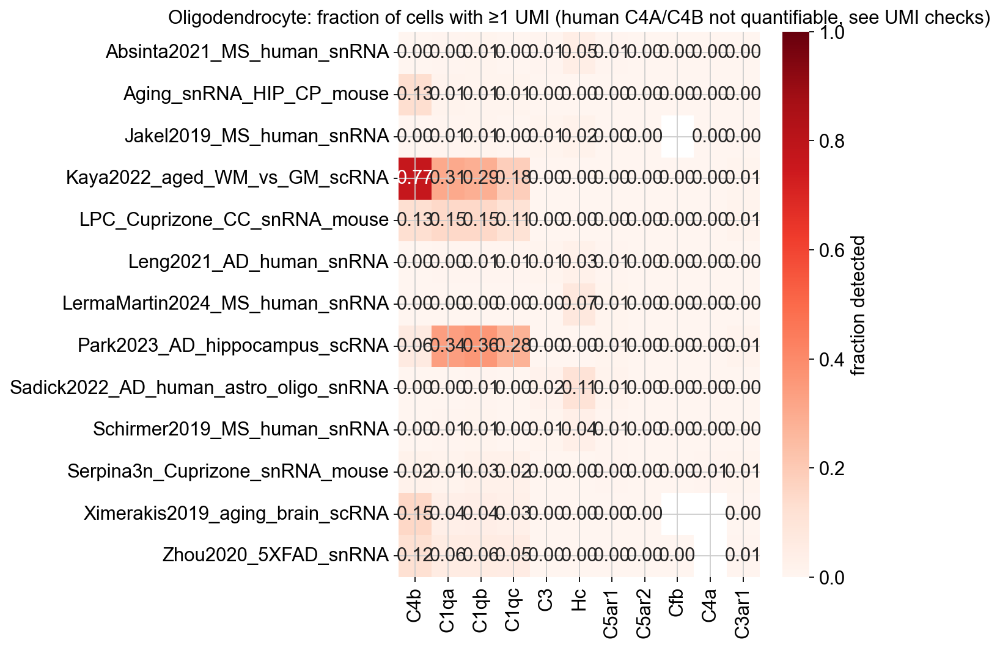

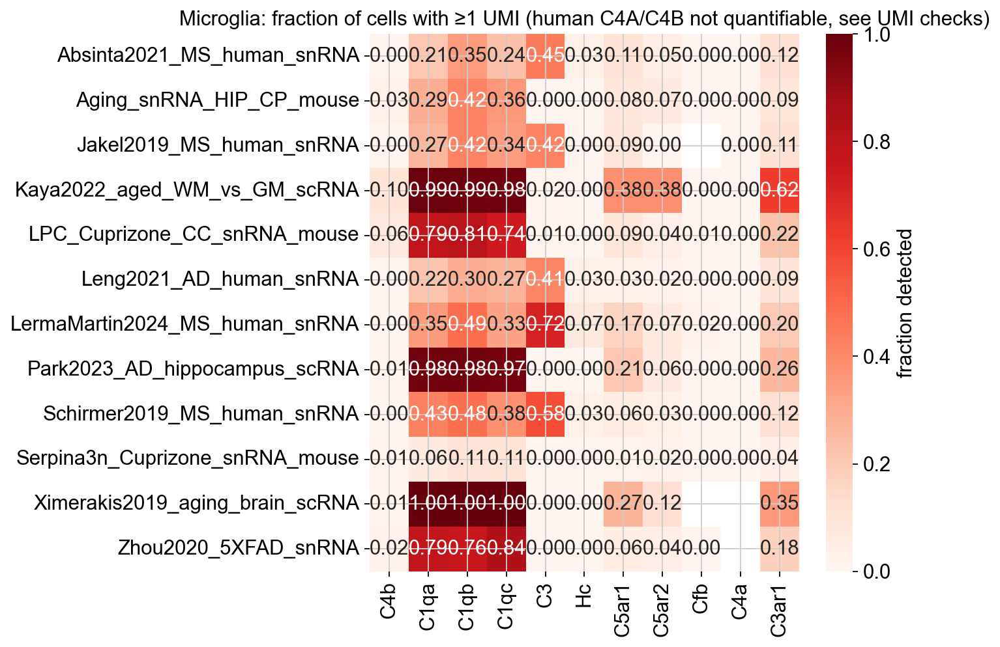

n_cells    C4b   C1qa   C1qb   C1qc     C3     Hc  C5ar1  C5ar2    Cfb    C4a  C3ar1  Serpina3n
dataset                               cell_type                                                                                                       
Absinta2021_MS_human_snRNA            Microglia           5432  0.000  0.214  0.346  0.238  0.447  0.034  0.112  0.045  0.000  0.000  0.121        NaN
                                      Oligodendrocyte    45697  0.000  0.004  0.008  0.004  0.006  0.046  0.006  0.001  0.000  0.000  0.001        NaN
Aging_snRNA_HIP_CP_mouse              Microglia           3112  0.027  0.291  0.419  0.359  0.000  0.001  0.083  0.070  0.002  0.004  0.091      0.002
                                      Oligodendrocyte    19593  0.130  0.013  0.012  0.010  0.000  0.000  0.001  0.001  0.001  0.004  0.003      0.006
Jakel2019_MS_human_snRNA              Microglia            428  0.000  0.266  0.418  0.343  0.418  0.005  0.091  0.000    NaN  0.000  0.114        NaN
                                      Oligodendrocyte     7973  0.000  0.006  0.008  0.004  0.010  0.022  0.002  0.000    NaN  0.000  0.001        NaN
Kaya2022_aged_WM_vs_GM_scRNA          Microglia           5054  0.100  0.991  0.988  0.984  0.015  0.000  0.384  0.384  0.001  0.000  0.622      0.032
                                      Oligodendrocyte    15776  0.768  0.306  0.285  0.185  0.001  0.000  0.002  0.003  0.000  0.003  0.009      0.417
LPC_Cuprizone_CC_snRNA_mouse          Microglia           5820  0.064  0.788  0.809  0.738  0.010  0.001  0.094  0.039  0.013  0.000  0.223      0.039
                                      Oligodendrocyte    12880  0.128  0.151  0.150  0.113  0.001  0.000  0.002  0.001  0.002  0.001  0.012      0.057
Leng2021_AD_human_snRNA               Microglia           4460  0.000  0.222  0.296  0.275  0.410  0.026  0.030  0.018  0.001  0.000  0.094      0.001
                                      Oligodendrocyte    26808  0.000  0.004  0.007  0.005  0.009  0.026  0.006  0.003  0.000  0.000  0.003      0.002
LermaMartin2024_MS_human_snRNA        Microglia           9238  0.000  0.350  0.488  0.326  0.715  0.073  0.167  0.068  0.016  0.000  0.202      0.000
                                      Oligodendrocyte    64833  0.000  0.000  0.000  0.000  0.002  0.075  0.008  0.000  0.000  0.000  0.000      0.001
Park2023_AD_hippocampus_scRNA         Microglia          13952  0.010  0.979  0.979  0.972  0.001  0.000  0.207  0.064  0.001  0.000  0.264      0.002
                                      Oligodendrocyte    10237  0.063  0.336  0.361  0.278  0.000  0.000  0.009  0.003  0.000  0.001  0.013      0.023
Sadick2022_AD_human_astro_oligo_snRNA Oligodendrocyte    33750  0.000  0.003  0.005  0.003  0.016  0.108  0.014  0.001  0.001  0.001  0.001      0.049
Schirmer2019_MS_human_snRNA           Microglia           1425  0.000  0.429  0.481  0.379  0.580  0.032  0.055  0.033  0.001  0.000  0.119      0.001
                                      Oligodendrocyte    12394  0.000  0.005  0.010  0.003  0.012  0.036  0.006  0.002  0.000  0.000  0.002      0.002
Serpina3n_Cuprizone_snRNA_mouse       Microglia           2413  0.010  0.063  0.112  0.106  0.000  0.000  0.012  0.016  0.002  0.002  0.036      0.016
                                      Oligodendrocyte     8207  0.023  0.015  0.027  0.025  0.001  0.001  0.004  0.003  0.001  0.006  0.010      0.011
Ximerakis2019_aging_brain_scRNA       Microglia           3910  0.009  0.999  0.998  0.997  0.002  0.000  0.271  0.118    NaN    NaN  0.353      0.002
                                      Oligodendrocyte    12384  0.155  0.039  0.041  0.029  0.000  0.000  0.000  0.000    NaN    NaN  0.001      0.035
Zhou2020_5XFAD_snRNA                  Microglia           4152  0.018  0.788  0.760  0.843  0.000  0.000  0.056  0.040  0.000    NaN  0.176      0.002
                                      Oligodendrocyte    17356  0.124  0.057  0.055  0.054  0.000  0.000  0.003  0.001  0.000    

In [4]:
for ct in ["Oligodendrocyte", "Microglia"]:
    h = DET[DET.cell_type == ct].set_index("dataset")[[g for g in FOCUS + ["C4a", "C3ar1"] if g in DET.columns]]
    plt.figure(figsize=(9, 0.42 * len(h) + 1.4))
    sns.heatmap(h.astype(float), annot=True, fmt=".2f", cmap="Reds", vmin=0, vmax=1, cbar_kws={"label": "fraction detected"})
    plt.title(f"{ct}: fraction of cells with ≥1 UMI (human C4A/C4B not quantifiable, see UMI checks)"); plt.ylabel(""); plt.tight_layout(); plt.show()
display(DET[DET.cell_type.isin(["Oligodendrocyte", "Microglia"])].set_index(["dataset", "cell_type"]).round(3))

## 3. Disease / age / demyelination effects in oligodendrocytes and microglia (pseudobulk per sample)

Groups are compared with a Mann–Whitney test when both have ≥3 samples (`*`); otherwise the log2 fold change is descriptive. Datasets with more than one contrast (LPC and cuprizone vs saline) appear once per contrast.

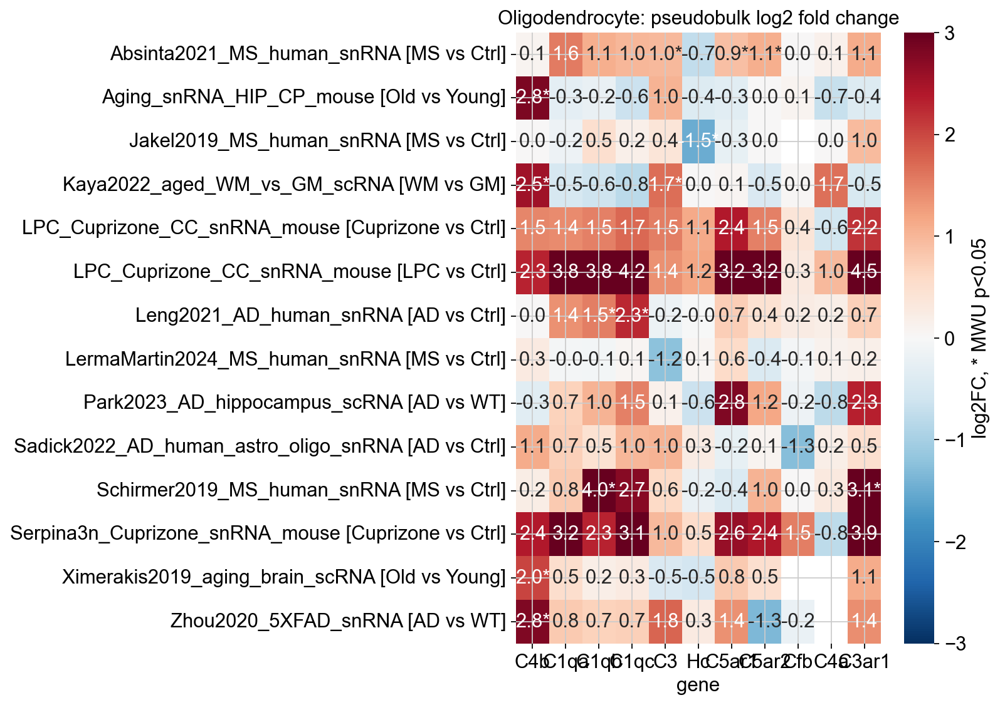

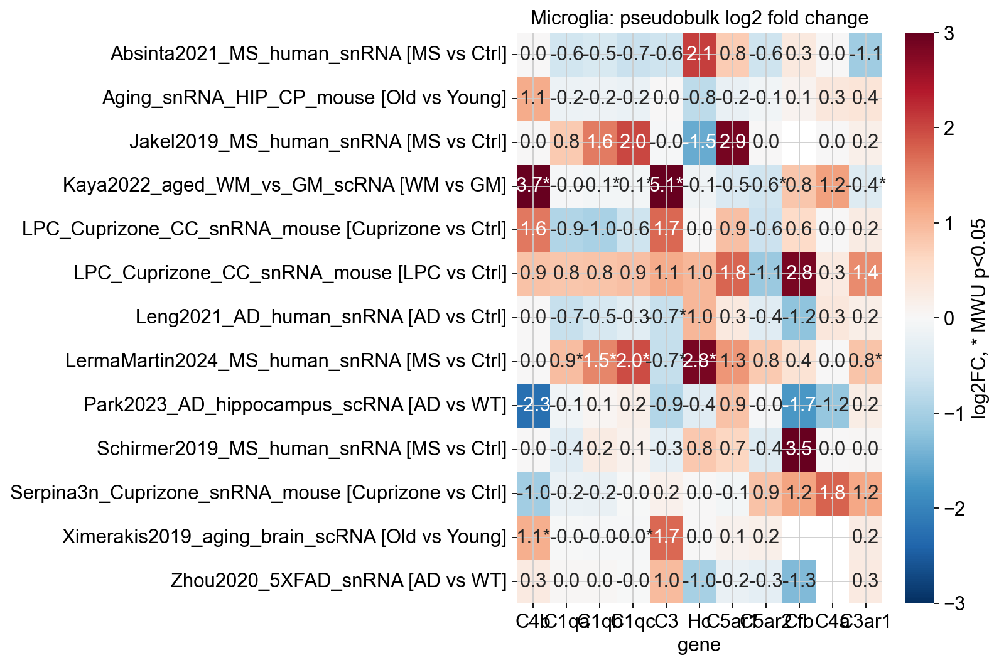

,dataset,cell_type,gene,alt,ref,mean_alt,mean_ref,log2FC,MWU_p,n_alt,n_ref,contrast
0,Absinta2021_MS_human_snRNA,Microglia,C1qa,MS,Ctrl,0.3619,0.5353,-0.5636,NaN,5,2,Absinta2021_MS_human_snRNA [MS vs Ctrl]
1,Aging_snRNA_HIP_CP_mouse,Microglia,C1qa,Old,Young,0.4370,0.4944,-0.1777,0.6857,4,4,Aging_snRNA_HIP_CP_mouse [Old vs Young]
2,Jakel2019_MS_human_snRNA,Microglia,C1qa,MS,Ctrl,0.7841,0.4517,0.7944,NaN,6,1,Jakel2019_MS_human_snRNA [MS vs Ctrl]
3,Kaya2022_aged_WM_vs_GM_scRNA,Microglia,C1qa,WM,GM,4.2880,4.3860,-0.0326,0.2500,5,3,Kaya2022_aged_WM_vs_GM_scRNA [WM vs GM]
4,LPC_Cuprizone_CC_snRNA_mouse,Microglia,C1qa,Cuprizone,Ctrl,0.5891,1.1051,-0.9066,NaN,2,4,LPC_Cuprizone_CC_snRNA_mouse [Cuprizone vs Ctrl]
5,LPC_Cuprizone_CC_snRNA_mouse,Microglia,C1qa,LPC,Ctrl,1.9582,1.1051,0.8247,NaN,2,4,LPC_Cuprizone_CC_snRNA_mouse [LPC vs Ctrl]
6,Leng2021_AD_human_snRNA,Microglia,C1qa,AD,Ctrl,0.3813,0.6169,-0.6927,0.1135,6,9,Leng2021_AD_human_snRNA [AD vs Ctrl]
7,LermaMartin2024_MS_human_snRNA,Microglia,C1qa,MS,Ctrl,0.5925,0.3089,0.9373,0.0110,10,6,LermaMartin2024_MS_human_snRNA [MS vs Ctrl]
8,Park2023_AD_hippocampus_scRNA,Microglia,C1qa,AD,WT,4.2724,4.6085,-0.1092,0.4000,3,3,Park2023_AD_hippocampus_scRNA [AD vs WT]
9,Schirmer2019_MS_human_snRNA,Microglia,C1qa,MS,Ctrl,1.3559,1.7409,-0.3603,NaN,12,2,Schirmer2019_MS_human_snRNA [MS vs Ctrl]


In [5]:
DE["contrast"] = DE["dataset"] + " [" + DE["alt"] + " vs " + DE["ref"] + "]"
for ct in ["Oligodendrocyte", "Microglia"]:
    d = DE[DE.cell_type == ct].pivot(index="contrast", columns="gene", values="log2FC")
    d = d[[g for g in FOCUS + ["C4a", "C3ar1"] if g in d.columns]]
    p = DE[DE.cell_type == ct].pivot(index="contrast", columns="gene", values="MWU_p").reindex(columns=d.columns)
    annot = d.round(1).astype(str) + np.where(p < 0.05, "*", "")
    plt.figure(figsize=(10, 0.42 * len(d) + 1.4))
    sns.heatmap(d.astype(float), annot=annot, fmt="", cmap="RdBu_r", center=0, vmin=-3, vmax=3, cbar_kws={"label": "log2FC, * MWU p<0.05"})
    plt.title(f"{ct}: pseudobulk log2 fold change"); plt.ylabel(""); plt.tight_layout(); plt.show()
display(DE[DE.cell_type.isin(["Oligodendrocyte", "Microglia"]) & DE.gene.isin(["C4b", "C1qa", "C3", "Hc", "C5ar1", "C5ar2", "Cfb"])]
        .sort_values(["cell_type", "gene", "dataset", "alt"]).round(4).reset_index(drop=True))

## 4. Co-expression with C4b inside oligodendrocytes

Spearman correlation and genome-wide rank (1 = most C4b-correlated gene) per dataset. Human datasets are absent here because C4A/C4B are not quantifiable in them.

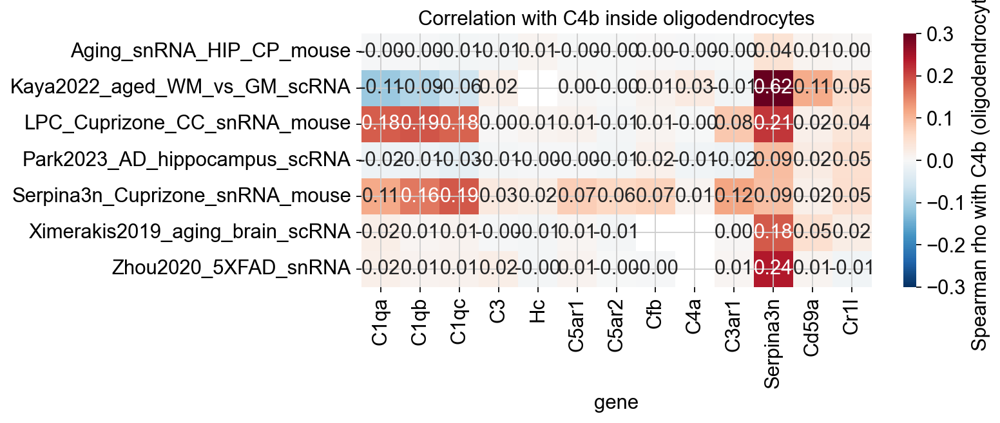

rank among all detected genes (1 = most C4b-correlated):


gene,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n,Cd59a,Cr1l
Aging_snRNA_HIP_CP_mouse,7317.0,7160.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2170.0,3515.0
Kaya2022_aged_WM_vs_GM_scRNA,11457.0,11382.0,11162.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,269.0,1105.0
LPC_Cuprizone_CC_snRNA_mouse,9.0,7.0,13.0,NaN,NaN,NaN,NaN,NaN,NaN,444.0,3.0,8834.0,4865.0
Park2023_AD_hippocampus_scRNA,10666.0,10649.0,10868.0,NaN,NaN,NaN,NaN,NaN,NaN,10673.0,109.0,5192.0,1252.0
Serpina3n_Cuprizone_snRNA_mouse,454.0,35.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,377.0,1332.0,NaN,6536.0
Ximerakis2019_aging_brain_scRNA,2824.0,6589.0,5920.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,117.0,2254.0
Zhou2020_5XFAD_snRNA,233.0,482.0,477.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,740.0,7891.0



top-20 C4b-correlated genes per dataset:
  Aging_snRNA_HIP_CP_mouse: Dgki, Neat1, Eya4, 9330199G10Rik, Cdh8, Sik3, Gm42756, Rnf220, Kcnq3, Agap1, Gm36855, Lypd6b, App, Aldh1l2, Gm42418, A330049N07Rik, Adamtsl1, Fmn1, Phactr1, Gm10863
  Kaya2022_aged_WM_vs_GM_scRNA: Serpina3n, Cldn11, Tmsb4x, Trf, Rab3b, Cela1, Cebpd, Cd9, H2-D1, Aldh1l2, Apod, Tmed10, Stat3, Anxa2, Socs3, Fxyd1, Plvap, Bcl3, Lbh, Masp1
  LPC_Cuprizone_CC_snRNA_mouse: Apoe, Ctsd, Serpina3n, Ddx60, Ctsb, Rhoj, C1qb, Slc39a14, C1qa, H2-D1, Hexb, B2m, C1qc, Fmn1, Lyz2, Ifi27l2a, Ctss, Apod, Nlrc5, Neat1
  Park2023_AD_hippocampus_scRNA: Micos13, mt-Nd3, Gm42418, mt-Nd2, Selenom, Gapdh, H3f3b, Hist1h1c, Retreg1, Snu13, mt-Atp6, mt-Nd4, mt-Nd1, Selenos, mt-Nd5, mt-Cytb, Selenof, Morf4l1, Tle5, Elob
  Serpina3n_Cuprizone_snRNA_mouse: Fcer1g, Hk2, Gm32509, C1qc, Tes, Ddx60, Fgd2, Gm20713, Gm13919, Apoe, Irf8, Cd180, Gm35188, Tbxas1, Casp8, Fyb, Rigi, Stab1, Zfp36l1, E130114P18Rik
  Ximerakis2019_aging_brain_scRNA: Serpina3n, H

In [6]:
R = pd.DataFrame({k: v["spearman_rho"] for k, v in CO.items()}).T
R = R[[g for g in FOCUS + ["C4a", "C3ar1", "Serpina3n", "Cd59a", "Cr1l"] if g in R.columns and g != "C4b"]]
plt.figure(figsize=(10, 0.42 * len(R) + 1.4))
sns.heatmap(R.astype(float), annot=True, fmt=".2f", cmap="RdBu_r", center=0, vmin=-0.3, vmax=0.3, cbar_kws={"label": "Spearman rho with C4b (oligodendrocytes)"})
plt.title("Correlation with C4b inside oligodendrocytes"); plt.ylabel(""); plt.tight_layout(); plt.show()
RK = pd.DataFrame({k: v["rank"] for k, v in RANKS.items()}).T.reindex(columns=R.columns)
print("rank among all detected genes (1 = most C4b-correlated):"); display(RK)
print("\ntop-20 C4b-correlated genes per dataset:")
for k, v in TOP.items():
    print(f"  {k}: {', '.join(v)}")

## 5. Human datasets by the authors' condition labels

Detection of the complement genes in oligodendrocytes and microglia by lesion type (MS) or Braak stage / diagnosis (AD). C4A/C4B rows are shown but are not quantifiable (see the UMI checks in section 1).

In [7]:
for (name, ct), t in COND.items():
    if INFO[name]["species"] != "human" or ct not in ("Oligodendrocyte", "Microglia"):
        continue
    print(f"=== {name} — {ct}"); display(t.round(3))
print("\nUMI totals for the human complement genes (C4A/C4B < ~1 UMI per 1,000 nuclei = not quantifiable):")
display(pd.concat(HUMAN_C4, names=["dataset", "gene"]))

=== Absinta2021_MS_human_snRNA — Oligodendrocyte


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1
group,,,,,,,,,,,,
MS_periplaque_white_matter,17563,0.0,0.001,0.003,0.001,0.006,0.056,0.008,0.001,0.0,0.0,0.001
chronic_active_MS_lesion_edge,12658,0.0,0.010,0.018,0.009,0.009,0.039,0.005,0.001,0.0,0.0,0.002
chronic_inactive_MS_lesion_edge,11193,0.0,0.003,0.006,0.003,0.004,0.031,0.003,0.000,0.0,0.0,0.000
control_white_matter,4264,0.0,0.001,0.004,0.002,0.003,0.070,0.003,0.000,0.0,0.0,0.000


=== Absinta2021_MS_human_snRNA — Microglia


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1
group,,,,,,,,,,,,
MS_lesion_core,651,0.0,0.220,0.378,0.215,0.558,0.055,0.108,0.025,0.0,0.0,0.147
MS_periplaque_white_matter,772,0.0,0.168,0.273,0.140,0.438,0.017,0.066,0.022,0.0,0.0,0.054
chronic_active_MS_lesion_edge,2873,0.0,0.221,0.365,0.261,0.424,0.036,0.145,0.062,0.0,0.0,0.123
chronic_inactive_MS_lesion_edge,847,0.0,0.217,0.315,0.253,0.407,0.032,0.070,0.026,0.0,0.0,0.126
control_white_matter,289,0.0,0.253,0.374,0.287,0.574,0.021,0.045,0.042,0.0,0.0,0.201


=== Jakel2019_MS_human_snRNA — Oligodendrocyte


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,C4a,C3ar1
group,,,,,,,,,,,
A,1102,0.0,0.005,0.007,0.004,0.012,0.012,0.000,0.0,0.0,0.001
CA,435,0.0,0.002,0.009,0.005,0.011,0.014,0.005,0.0,0.0,0.002
CI,1068,0.0,0.003,0.009,0.003,0.009,0.017,0.001,0.0,0.0,0.001
Ctrl,3530,0.0,0.006,0.008,0.004,0.009,0.034,0.002,0.0,0.0,0.000
NAWM,1478,0.0,0.008,0.009,0.005,0.014,0.014,0.001,0.0,0.0,0.001
RM,360,0.0,0.006,0.003,0.000,0.006,0.000,0.000,0.0,0.0,0.000


=== Jakel2019_MS_human_snRNA — Microglia


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,C4a,C3ar1
group,,,,,,,,,,,
A,218,0.0,0.243,0.417,0.362,0.390,0.000,0.119,0.0,0.0,0.092
CA,41,0.0,0.195,0.341,0.293,0.463,0.000,0.122,0.0,0.0,0.171
CI,32,0.0,0.469,0.625,0.500,0.469,0.031,0.125,0.0,0.0,0.156
Ctrl,78,0.0,0.256,0.295,0.192,0.423,0.013,0.026,0.0,0.0,0.115
NAWM,57,0.0,0.298,0.526,0.421,0.474,0.000,0.035,0.0,0.0,0.123


=== Leng2021_AD_human_snRNA — Oligodendrocyte


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
0,2291,0.0,0.001,0.000,0.002,0.007,0.020,0.007,0.002,0.0,0.0,0.002,0.002
2,6436,0.0,0.003,0.005,0.002,0.011,0.031,0.003,0.003,0.0,0.0,0.003,0.002
6,18081,0.0,0.005,0.009,0.007,0.008,0.025,0.006,0.003,0.0,0.0,0.003,0.001


=== Leng2021_AD_human_snRNA — Microglia


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
0,310,0.0,0.216,0.174,0.194,0.597,0.016,0.013,0.023,0.003,0.0,0.039,0.003
2,1083,0.0,0.274,0.367,0.307,0.505,0.016,0.044,0.021,0.001,0.0,0.107,0.001
6,3067,0.0,0.205,0.283,0.271,0.357,0.031,0.026,0.016,0.000,0.0,0.095,0.001


=== LermaMartin2024_MS_human_snRNA — Oligodendrocyte


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
CA,27370,0.0,0.0,0.001,0.001,0.001,0.060,0.014,0.000,0.0,0.0,0.0,0.001
CI,15968,0.0,0.0,0.000,0.000,0.001,0.089,0.003,0.001,0.0,0.0,0.0,0.001
Ctrl,21495,0.0,0.0,0.000,0.000,0.003,0.083,0.004,0.000,0.0,0.0,0.0,0.000


=== LermaMartin2024_MS_human_snRNA — Microglia


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
CA,4410,0.0,0.400,0.617,0.406,0.737,0.077,0.246,0.085,0.028,0.0,0.222,0.0
CI,2824,0.0,0.401,0.500,0.368,0.636,0.112,0.107,0.055,0.003,0.0,0.249,0.0
Ctrl,2004,0.0,0.166,0.187,0.089,0.778,0.007,0.079,0.048,0.008,0.0,0.094,0.0


=== Schirmer2019_MS_human_snRNA — Oligodendrocyte


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
Acute/Chronic active,8266,0.0,0.006,0.013,0.004,0.013,0.038,0.006,0.002,0.0,0.0,0.003,0.002
Chronic inactive,1058,0.0,0.004,0.009,0.001,0.013,0.022,0.002,0.003,0.0,0.0,0.002,0.001
Control,3070,0.0,0.003,0.002,0.001,0.008,0.036,0.005,0.001,0.0,0.0,0.001,0.002


=== Schirmer2019_MS_human_snRNA — Microglia


,n_cells,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
group,,,,,,,,,,,,,
Acute/Chronic active,1032,0.0,0.413,0.493,0.396,0.583,0.037,0.047,0.034,0.001,0.0,0.123,0.000
Chronic inactive,257,0.0,0.459,0.479,0.335,0.514,0.023,0.101,0.027,0.000,0.0,0.105,0.000
Control,136,0.0,0.500,0.390,0.331,0.676,0.015,0.037,0.037,0.000,0.0,0.110,0.007



UMI totals for the human complement genes (C4A/C4B < ~1 UMI per 1,000 nuclei = not quantifiable):


total_UMIs  cells_detected
dataset                               gene                             
Absinta2021_MS_human_snRNA            C4A            22              22
                                      C4B            12              12
                                      C5           3413            2988
                                      C5AR1        1854            1522
                                      C5AR2         344             321
                                      CFB             6               6
                                      C3           6490            3443
                                      C1QA         2194            1506
                                      PLP1       780566           50652
Jakel2019_MS_human_snRNA              C4A             5               5
                                      C4B             6               4
                                      C5            380             359
                                      C5AR1         190             165
                                      C5AR2          10              10
                                      C3            765             580
                                      C1QA          447             317
                                      PLP1       139859           11263
Leng2021_AD_human_snRNA               C4A            16              16
                                      C4B            19              18
                                      C5           3205            3020
                                      C5AR1        2030            1927
                                      C5AR2         883             840
                                      CFB            86              85
                                      C3           5919            4379
                                      C1QA         2141            1770
                                      PLP1       123030           35601
LermaMartin2024_MS_human_Visium       C4A           138             138
                                      C4B           242             234
                                      C5            950             900
                                      C5AR1        3693            3089
                                      C5AR2         281             265
                                      CFB          1248            1167
                                      C3          72375           26686
                                      C1QA        44852           20215
                                      PLP1      1918911           61098
LermaMartin2024_MS_human_snRNA        C4A            87              84
                                      C4B           147             143
                                      C5          11740            8549
                                      C5AR1        5930            4042
                                      C5AR2        1143             913
                                      CFB           699             571
                                      C3          32185           10812
                                      C1QA         6140            3383
                                      PLP1      1186262           60647
Sadick2022_AD_human_astro_oligo_snRNA C4A           458             451
                                      C4B           470             459
                                      C5          18803           14417
                                      C5AR1        5861            4033
                                      C5AR2         896             678
                                      CFB           929             810
                                      C3          25479            9873
                                      C1QA         4707            2273
                                      PLP1       496308           39109
Schirmer2019_MS_human_snRNA           C4A            33              15
             

## 6. Spatial datasets: complement across spots

In [8]:
for (name, kind), t in SPATIAL.items():
    print(f"=== {name} — {kind}"); display(t.round(4))

=== Chen2020_ST_AppNLGF_mouse — means


,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
WT_3M,0.0989,0.2667,0.3283,0.2824,0.0113,0.0079,0.0045,0.0048,0.0006,0.0585,0.0149,0.1494
AD_3M,0.0924,0.2594,0.2924,0.3096,0.0081,0.0051,0.0034,0.0049,0.0007,0.0477,0.0190,0.1307
WT_18M,0.1874,0.2537,0.2864,0.2989,0.0133,0.0064,0.0046,0.0050,0.0002,0.1065,0.0190,0.1351
AD_18M,0.7539,0.7776,0.8155,0.7938,0.0233,0.0046,0.0078,0.0066,0.0009,0.4537,0.0645,0.5426
WT_6M,0.0716,0.1499,0.1635,0.1651,0.0113,0.0069,0.0054,0.0023,0.0000,0.0433,0.0151,0.0591
AD_6M,0.1135,0.1676,0.2003,0.2074,0.0077,0.0057,0.0038,0.0002,0.0003,0.0662,0.0227,0.0643
WT_12M,0.1187,0.2287,0.2569,0.2340,0.0161,0.0110,0.0094,0.0060,0.0000,0.0753,0.0145,0.1031
AD_12M,0.4634,0.5849,0.6823,0.6059,0.0239,0.0133,0.0048,0.0102,0.0009,0.3315,0.0549,0.3801


=== Chen2020_ST_AppNLGF_mouse — coexpr


,frac_in_C4b-,frac_in_C4b+,frac_in_C4b-high,enrichment(+/-),spearman_rho,fisher_p,rank
gene,,,,,,,
C1qa,0.5040,0.7346,0.7961,1.4576,0.3479,0.0000,11.0
C1qb,0.5542,0.7629,0.8267,1.3767,0.3346,0.0000,15.0
C1qc,0.5208,0.7320,0.7986,1.4054,0.3156,0.0000,18.0
C3,0.0280,0.0515,0.0651,1.8399,0.0682,0.0000,986.0
Hc,0.0187,0.0217,0.0175,1.1617,0.0031,0.1557,13750.0
C5ar1,0.0129,0.0198,0.0185,1.5391,0.0242,0.0002,5564.0
C5ar2,0.0157,0.0187,0.0215,1.1914,0.0096,0.1240,10575.0
Cfb,0.0014,0.0026,0.0025,1.8156,0.0121,0.0940,NaN
C4a,0.1220,0.5581,0.8071,4.5740,0.5627,0.0000,1.0


=== LermaMartin2024_MS_human_Visium — means


,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
Chronic Active,0.0074,0.8599,1.3462,0.7023,0.9569,0.0122,0.1228,0.0047,0.0287,0.0032,0.1882,1.2760
Control,0.0012,0.3340,0.5876,0.2409,0.6027,0.0241,0.0144,0.0035,0.0185,0.0008,0.0536,0.3807
Chronic Inactive,0.0033,0.3613,0.5292,0.2919,0.7255,0.0182,0.0651,0.0104,0.0276,0.0034,0.0645,1.3895


=== LermaMartin2024_MS_human_Visium — coexpr


,frac_in_C4b-,frac_in_C4b+,frac_in_C4b-high,enrichment(+/-),spearman_rho,fisher_p,rank
gene,,,,,,,
C1qa,0.2868,0.5983,0.2881,2.0863,0.0381,0.0000,124.0
C1qb,0.4004,0.6795,0.4746,1.6969,0.0352,0.0000,236.0
C1qc,0.2336,0.5299,0.1864,2.2680,0.0387,0.0000,138.0
C3,0.3787,0.7436,0.6271,1.9634,0.0502,0.0000,17.0
Hc,0.0127,0.0342,0.0169,2.6831,0.0109,0.0112,9782.0
C5ar1,0.0437,0.1368,0.1017,3.1316,0.0254,0.0000,1355.0
C5ar2,0.0038,0.0085,0.0000,2.2750,0.0045,0.2211,NaN
Cfb,0.0166,0.0256,0.0169,1.5461,0.0040,0.2937,12232.0
C4a,0.0018,0.0385,0.0000,20.8718,0.0475,0.0000,NaN


=== SenescentGlia2025_MS_human_Visium — means


,C4b,C1qa,C1qb,C1qc,C3,Hc,C5ar1,C5ar2,Cfb,C4a,C3ar1,Serpina3n
secondary progressive MS,0.0008,0.0889,0.1482,0.0496,0.1196,0.0079,0.0059,0.0052,0.0055,0.0012,0.0201,0.2020
progressive MS,0.0053,0.4159,0.7182,0.2223,0.4937,0.0078,0.0214,0.0032,0.0048,0.0068,0.0342,0.8420
primary progressive MS,0.0025,0.1455,0.2204,0.0714,0.2107,0.0362,0.0152,0.0077,0.0084,0.0018,0.0879,0.1944


## 7. Cross-dataset summary

In [9]:
summ = DET[DET.cell_type.isin(["Oligodendrocyte", "Microglia"])].set_index(["dataset", "cell_type"])[["n_cells"] + [g for g in FOCUS if g in DET.columns]]
display(summ.round(3))
display(pd.DataFrame(INFO).T)

n_cells    C4b   C1qa   C1qb   C1qc     C3     Hc  C5ar1  C5ar2    Cfb
dataset                               cell_type                                                                              
Absinta2021_MS_human_snRNA            Microglia           5432  0.000  0.214  0.346  0.238  0.447  0.034  0.112  0.045  0.000
                                      Oligodendrocyte    45697  0.000  0.004  0.008  0.004  0.006  0.046  0.006  0.001  0.000
Aging_snRNA_HIP_CP_mouse              Microglia           3112  0.027  0.291  0.419  0.359  0.000  0.001  0.083  0.070  0.002
                                      Oligodendrocyte    19593  0.130  0.013  0.012  0.010  0.000  0.000  0.001  0.001  0.001
Jakel2019_MS_human_snRNA              Microglia            428  0.000  0.266  0.418  0.343  0.418  0.005  0.091  0.000    NaN
                                      Oligodendrocyte     7973  0.000  0.006  0.008  0.004  0.010  0.022  0.002  0.000    NaN
Kaya2022_aged_WM_vs_GM_scRNA          Microglia           5054  0.100  0.991  0.988  0.984  0.015  0.000  0.384  0.384  0.001
                                      Oligodendrocyte    15776  0.768  0.306  0.285  0.185  0.001  0.000  0.002  0.003  0.000
LPC_Cuprizone_CC_snRNA_mouse          Microglia           5820  0.064  0.788  0.809  0.738  0.010  0.001  0.094  0.039  0.013
                                      Oligodendrocyte    12880  0.128  0.151  0.150  0.113  0.001  0.000  0.002  0.001  0.002
Leng2021_AD_human_snRNA               Microglia           4460  0.000  0.222  0.296  0.275  0.410  0.026  0.030  0.018  0.001
                                      Oligodendrocyte    26808  0.000  0.004  0.007  0.005  0.009  0.026  0.006  0.003  0.000
LermaMartin2024_MS_human_snRNA        Microglia           9238  0.000  0.350  0.488  0.326  0.715  0.073  0.167  0.068  0.016
                                      Oligodendrocyte    64833  0.000  0.000  0.000  0.000  0.002  0.075  0.008  0.000  0.000
Park2023_AD_hippocampus_scRNA         Microglia          13952  0.010  0.979  0.979  0.972  0.001  0.000  0.207  0.064  0.001
                                      Oligodendrocyte    10237  0.063  0.336  0.361  0.278  0.000  0.000  0.009  0.003  0.000
Sadick2022_AD_human_astro_oligo_snRNA Oligodendrocyte    33750  0.000  0.003  0.005  0.003  0.016  0.108  0.014  0.001  0.001
Schirmer2019_MS_human_snRNA           Microglia           1425  0.000  0.429  0.481  0.379  0.580  0.032  0.055  0.033  0.001
                                      Oligodendrocyte    12394  0.000  0.005  0.010  0.003  0.012  0.036  0.006  0.002  0.000
Serpina3n_Cuprizone_snRNA_mouse       Microglia           2413  0.010  0.063  0.112  0.106  0.000  0.000  0.012  0.016  0.002
                                      Oligodendrocyte     8207  0.023  0.015  0.027  0.025  0.001  0.001  0.004  0.003  0.001
Ximerakis2019_aging_brain_scRNA       Microglia           3910  0.009  0.999  0.998  0.997  0.002  0.000  0.271  0.118    NaN
                                      Oligodendrocyte    12384  0.155  0.039  0.041  0.029  0.000  0.000  0.000  0.000    NaN
Zhou2020_5XFAD_snRNA                  Microglia           4152  0.018  0.788  0.760  0.843  0.000  0.000  0.056  0.040  0.000
                                      Oligodendrocyte    17356  0.124  0.057  0.055  0.054  0.000  0.000  0.003  0.001  0.000

,n_cells,species,modality,n_samples,groups
Absinta2021_MS_human_snRNA,66432,human,snRNA,8,"{'MS': 61141, 'Ctrl': 5291}"
Aging_snRNA_HIP_CP_mouse,109822,mouse,snRNA,8,"{'Young': 60384, 'Old': 49438}"
Chen2020_ST_AppNLGF_mouse,19021,mouse,spatial,20,"{'WT': 9542, 'AD': 9479}"
Jakel2019_MS_human_snRNA,17790,human,snRNA,20,"{'MS': 11199, 'Ctrl': 6591}"
Kaya2022_aged_WM_vs_GM_scRNA,29623,mouse,scRNA,8,"{'WM': 23391, 'GM': 6232}"
LPC_Cuprizone_CC_snRNA_mouse,30338,mouse,snRNA,8,"{'Ctrl': 14550, 'LPC': 9493, 'Cuprizone': 6295}"
Leng2021_AD_human_snRNA,92199,human,snRNA,20,"{'AD': 51980, 'Ctrl': 40219}"
LermaMartin2024_MS_human_Visium,70238,human,spatial,18,"{'MS': 45870, 'Ctrl': 24368}"
LermaMartin2024_MS_human_snRNA,102672,human,snRNA,16,"{'MS': 73637, 'Ctrl': 29035}"
Park2023_AD_hippocampus_scRNA,47660,mouse,scRNA,6,"{'AD': 27003, 'WT': 20657}"


### Interpretation

**Scope.** Sixteen public datasets processed with one pipeline and a shared coarse annotation: mouse AD (Park, Zhou 5XFAD), mouse aging (aging snRNA-seq, Ximerakis, Kaya aged WM vs GM), toxic demyelination (LPC + cuprizone, Serpina3n-cKO cuprizone), mouse spatial AD (Chen), human AD (Leng, Sadick), human MS single-nucleus (Jäkel, Absinta, Schirmer, Lerma-Martin) and human MS Visium (Lerma-Martin, senescent-glia). Oligodendrocyte and microglia labels were checked against Plp1/PLP1 and Hexb (≈100 % and 92–100 % detection in the mouse datasets); OPC / neuron labels in Park and the myeloid split in Sadick (labelled "Immune" rather than "Microglia") were not used.

**C4b itself.** In mouse oligodendrocytes C4b goes up with age in every aging dataset (pseudobulk log2FC ≈ 2–3, MWU p < 0.05 in aging snRNA-seq and Ximerakis), is far higher in aged white than grey matter (Kaya: 77 % of WM oligodendrocytes C4b⁺), is up ~2.8 log2 in 5XFAD oligodendrocytes and rises with toxic demyelination (oligodendrocyte detection 8 % in saline/chow controls → 16 % after cuprizone → 34 % after LPC in the corpus-callosum dataset). It did not rise in the pooled Park App^NL-G-F^ libraries (one library per age × genotype; no power). In the Chen Spatial Transcriptomics data C4b climbs from 0.19 (WT 18 mo) to 0.75 (AD 18 mo) and its top-30 spot-level correlates are the plaque-induced / DAM genes (C4a, Cst7, Gfap, Ctsd, Tyrobp, Trem2, Apoe, C1qa–c, Serpina3n). **Human C4A/C4B cannot be evaluated in any of the eight human datasets**: 5–470 total UMIs in 17–107 k nuclei (vs. 10⁵–10⁶ for PLP1) and 19–242 UMIs in 28–70 k Visium spots. This is the signature of multi-mapping reads between the near-identical C4A/C4B paralogs being discarded by Cell Ranger / Space Ranger, not of biological absence; a multi-mapping-aware re-quantification is needed before anything can be said about human C4.

**C5 (Hc / C5).** Mouse: ≤0.3 % of cells of any type in all eight mouse single-cell datasets, ~2 % of Chen spots, no disease, age or demyelination change. Human: a low but consistent glial C5 transcript is present in every human dataset (oligodendrocytes 2–11 %, astrocytes 4–17 %, OPCs 3–17 %; highest in the deeply sequenced Sadick and Lerma-Martin sets), unchanged or slightly lower in MS lesions and unchanged across Braak stages. C5 is therefore not a disease-responsive transcript in glia; the C5a arm has to be read at protein level.

**C5a receptors.** C5ar1 is myeloid in all sixteen datasets: 6–38 % of mouse microglia (highest in aged white matter), 3–17 % of human microglia nuclei, and ≤0.9 % of mouse and ≤1.4 % of human oligodendrocytes. In human MS, microglial C5AR1 is highest at chronic active lesion edges (Absinta 14.5 % vs 4.5 % control WM; Lerma-Martin 25 % in chronic active vs 8 % control, pseudobulk log2FC 1.3, p = 0.056; Jäkel 12 % in active lesions vs 3 %) and in mouse it rises in LPC-lesion microglia (log2FC 1.75, n = 2 vs 4). C5ar2 follows at lower levels. Human AD microglia show no C5AR1 change across Braak stages (Leng) and Sadick has too few microglia to test. The matched Lerma-Martin Visium sections show the same thing spatially: mean C5AR1 is 8.5-fold higher in chronic active lesion spots than in control white matter (0.12 vs 0.014), alongside 2.5-fold C1Q, 1.6-fold C3 and 3.4-fold SERPINA3. So the in-house conclusion that C4b⁺ oligodendrocytes do not express C5a receptors holds in every dataset, mouse and human, while the receptor is enriched on lesion-associated myeloid cells.

**C1q.** Microglial everywhere (76–100 % of mouse microglia, 21–62 % of human microglia nuclei, higher in MS lesions than control WM in Lerma-Martin, log2FC 0.94, p = 0.011). Inside oligodendrocytes, C1q detection is 30–36 % in droplet scRNA-seq (Park, Kaya) but 0–6 % in snRNA-seq: ambient microglial RNA. The exception is the demyelination models, where C1q is detected in 65 % of LPC-lesion "oligodendrocyte" nuclei and is a top-10 C4b correlate together with Apoe, Ctsd, Hexb, Lyz2 and Ctss, i.e. C4b⁺ nuclei from active lesions carry a microglial signature (ambient RNA or phagocytic doublets). C1q co-varies with C4b at tissue level in the Chen spatial data (rank 11–18 of ~14 k, ρ ≈ 0.33) and modestly in 5XFAD nuclei (rank 233–482) but not in aging (rank > 2,800) or in Kaya (negative, grey-matter oligodendrocytes carry more ambient C1q).

**Cfb.** Silent outside inflammatory demyelination: ≤0.2 % of microglia and ≤0.1 % of oligodendrocytes in every mouse AD and aging dataset, 0.2–1.6 % in LPC/cuprizone microglia, ≤0.1 % of Chen spots. In human MS it appears only in chronic-active-lesion microglia (Lerma-Martin 2.8 % vs 0.8 % control; 6–929 UMIs in the other sets). Together with the in-house Xenium EAE result (Cfb in 67 % of lesion macrophages), Cfb marks active inflammatory demyelination rather than the age- or amyloid-associated C4b⁺ oligodendrocyte state.

**Genome-wide view inside oligodendrocytes.** In the datasets with a clean C4b⁺ population, Serpina3n is the #1 C4b-correlated gene (Kaya, Ximerakis, Zhou; rank 3 in LPC/cuprizone, 109 in Park), followed by the MHC-I / interferon module (H2-D1, B2m, H2-K1, Ifi27, Irf9, Stat3), Klk6, Apod, Trf, Cd9 and Cldn11. No complement receptor, Cfb or Hc ranks in the top 1,000 in any dataset; the complement genes that do are C4a (Chen ST rank 1; 4-fold enrichment in Kaya), Cd59a (Kaya 269, Ximerakis 117, Zhou 740) and Cr1l / Crry (Kaya 1,105, Park 1,252): C4b⁺ oligodendrocytes up-regulate protection against complement deposition, not receptors. In the Serpina3n-cKO cuprizone dataset only 2 % of oligodendrocyte nuclei are C4b⁺ and their correlates are microglial (Fcer1g, Irf8, C1qc), so that dataset does not contain a usable C4b⁺ oligodendrocyte population.

**Caveats.** (1) Coarse annotation is marker-based for Park, aging snRNA-seq, Zhou, Kaya, Leng, Sadick, LPC/cuprizone and Serpina3n-cKO; only oligodendrocyte and microglia labels were validated (and Sadick's myeloid cells fell under "Immune"). (2) Pseudobulk tests are underpowered for Park (3 vs 3), LPC/cuprizone (2 vs 4), Serpina3n-cKO (4 vs 1) and several human sets (1–2 control donors in microglia); treat those log2FCs as descriptive. (3) Kaya's 10x libraries are all 24 months old (white vs grey matter, not young vs aged). (4) The senescent-glia Visium set has no control sections and C4A/C4B are not quantifiable in it, so it only contributes spot means by MS subtype; in the Lerma-Martin Visium the C4B spot-level co-expression table rests on 234 C4B⁺ spots out of 70 k and should be ignored for the same reason. (5) Nuclei from active demyelinating lesions carry microglial ambient RNA; C1q/Apoe/Ctsd "in" oligodendrocytes there should not be read as intrinsic. (6) Human C4A/C4B need a multi-mapping-aware re-quantification (STARsolo with EM, or a merged C4A/C4B reference) before human C4 can be assessed.